In [1]:
from lxml import etree
import numpy as np
import cv2
import pandas as pd
import os
import matplotlib.pyplot as plt
from skimage import io
from skimage.transform import resize
import random
from time import time
from sklearn.decomposition import PCA
import pickle
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.models import model_from_json
from keras.layers import Input, Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Activation
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras.optimizers import SGD, Adam
from keras import backend as K
from keras.models import Model

#pip3 install scikit-image==0.14.2 --user
#pip3 install numpy==1.16.3 --user
#https://stackoverflow.com/questions/54241226/importerror-cannot-import-name-validate-lengths  --comment of 'Alka'

Using TensorFlow backend.


# Summary

## Auto-encoder

### PCA vs auto-encoder
An auto-encoder is typically considered and depicted as an encoder-decoder structure. As a first task, consider an auto-encoder that mimics linear PCA. Explain how you can do this and what the differences are. In terms of a neural network the auto-encoder
will contain an input layer, one hidden layer and an output layer. It is optional to practically experiment, but we ask you to elaborate theoretically on the expected differences in results when PCA is framed into a neural network. We do not expect any mathematical proves, but rather want you to show us your understandings.

### Non-linear and convolutional
When working with images, it has been shown that convolutional neural networks (CNNs) have superior performance compared to fully-connected variants. 


## Object classification using CNN
The auto-encoder which you have built now represents an image in a number of coding variables (maybe still spatially distributed as a feature map), which is (hopefully) relatively small compared to the number of pixels. The question remains whether these variables contain semantic information, hence can be used to classify images into distinct classes. <br>

Take the coding variables of your auto-encoder and train a classifier. You should train two networks. First, simply take the encoding part of your auto-encoder, freeze these layers and add a fully-connected layer at the end. Second, you will use the same network architecture but train all parameters from scratch.

In [2]:
# parameters that you should set before running this script
n_classes = 5
filter = ['aeroplane', 'car', 'chair', 'dog', 'bird']       # select class, this default should yield 1489 training and 1470 validation images
voc_root_folder = r'''C:\Users\Triguna\Documents\Thesis\ReferenceCode\Computer Vision\VOCdevkit\\'''  # please replace with the location on your laptop where you unpacked the tarball
image_size = 128    # image size that you will use for your network (input images will be resampled to this size), lower if you have troubles on your laptop (hint: use io.imshow to inspect the quality of the resampled images before feeding it into your network!)
img_rows, img_cols = image_size, image_size
n_channels = 3

In [3]:
# step1 - build list of filtered filenames
annotation_folder = os.path.join(voc_root_folder, "VOC2009/Annotations/")
annotation_files = os.listdir(annotation_folder)
filtered_filenames = []
for a_f in annotation_files:
    tree = etree.parse(os.path.join(annotation_folder, a_f))
    if np.any([tag.text == filt for tag in tree.iterfind(".//name") for filt in filter]):
        filtered_filenames.append(a_f[:-4])

# step2 - build (x,y) for TRAIN/VAL (classification)
classes_folder = os.path.join(voc_root_folder, "VOC2009/ImageSets/Main/")
classes_files = os.listdir(classes_folder)
train_files = [os.path.join(classes_folder, c_f) for filt in filter for c_f in classes_files if filt in c_f and '_train.txt' in c_f]
val_files = [os.path.join(classes_folder, c_f) for filt in filter for c_f in classes_files if filt in c_f and '_val.txt' in c_f]

In [4]:
def build_classification_dataset(list_of_files):
    """ build training or validation set

    :param list_of_files: list of filenames to build trainset with
    :return: tuple with x np.ndarray of shape (n_images, image_size, image_size, 3) and  y np.ndarray of shape (n_images, n_classes)
    """
    temp = []
    train_labels = []
    for f_cf in list_of_files:
        with open(f_cf) as file:
            lines = file.read().splitlines()
            temp.append([line.split()[0] for line in lines if int(line.split()[-1]) == 1])
            label_id = [f_ind for f_ind, filt in enumerate(filter) if filt in f_cf][0]
            train_labels.append(len(temp[-1]) * [label_id])
    train_filter = [item for l in temp for item in l]

    image_folder = os.path.join(voc_root_folder, "VOC2009/JPEGImages/")
    image_filenames = [os.path.join(image_folder, file) for f in train_filter for file in os.listdir(image_folder) if
                       f in file]
    x = np.array([resize(io.imread(img_f), (image_size, image_size, 3)) for img_f in image_filenames]).astype(
        'float32')
    # changed y to an array of shape (num_examples, num_classes) with 0 if class is not present and 1 if class is present
    y_temp = []
    for tf in train_filter:
        y_temp.append([1 if tf in l else 0 for l in temp])
    y = np.array(y_temp)

    return x, y


x_train, y_train = build_classification_dataset(train_files)
print('%i training images from %i classes' %(x_train.shape[0], y_train.shape[1]))
x_val, y_val = build_classification_dataset(val_files)
print('%i validation images from %i classes' %(x_val.shape[0],  y_train.shape[1]))

# from here, you can start building your model
# you will only need x_train and x_val for the autoencoder
# you should extend the above script for the segmentation task (you will need a slightly different function for building the label images)

C:\Users\Triguna\AppData\Roaming\Python\Python37\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
C:\Users\Triguna\AppData\Roaming\Python\Python37\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


1489 training images from 5 classes
1470 validation images from 5 classes


### Display some random images

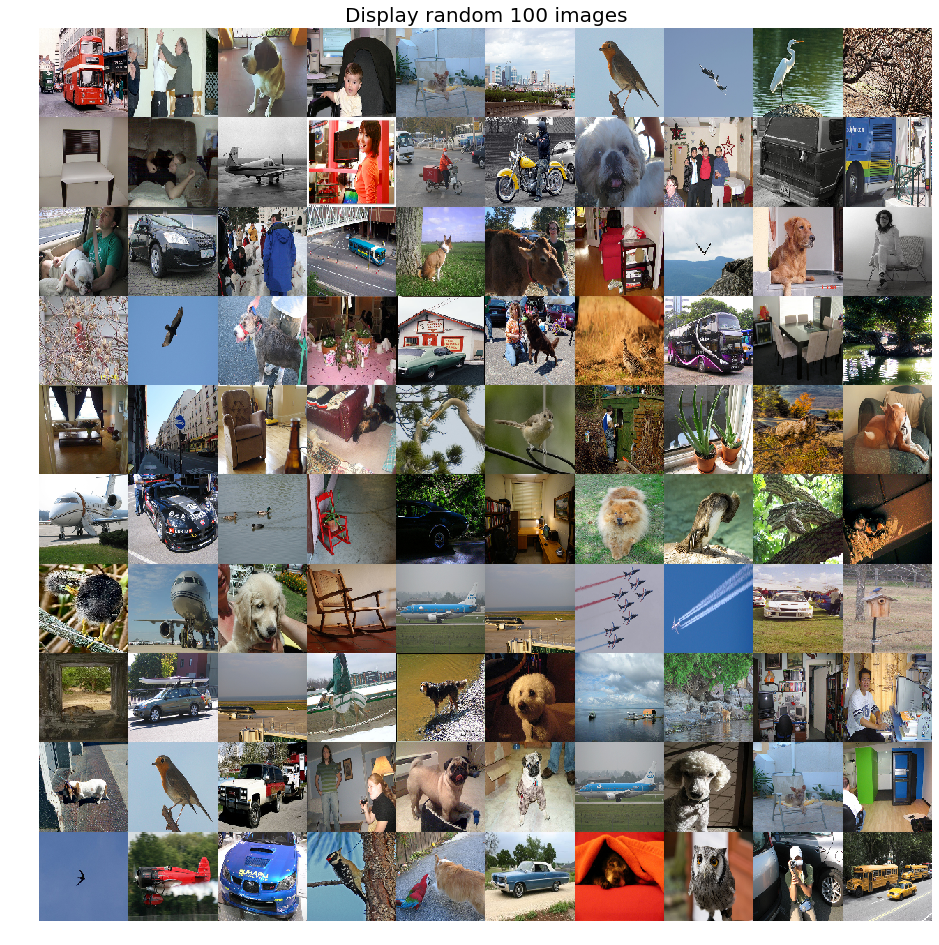

In [5]:
num_test_images = 100
random_indices = [random.randint(0, x_train.shape[0]) for i in range(num_test_images)] 
vStack = []
for j in range(10):
    h_list = [x_train[random_indices[i+j*10]] for i in range(10)]
    h_tuple = tuple(h_list)
    vStack.append(np.hstack((h_tuple)))

image_list = [tuple(vStack[j]) for j in range(10)]
image = np.vstack((tuple(image_list)))

plt.figure(figsize=(16,50))
plt.title('Display random 100 images', fontsize=20)
plt.axis('off')
plt.imshow(image)

## Save the images in a dataframe for easier acces in the future

#### Keep the training set as it is
#### Split the validation set into two equal halves, one for validation and other for testing

In [6]:
X_Train = x_train.copy()
X_Val = x_val.copy()
X_Train = (255*X_Train).astype('uint8')
X_Val = (255*X_Val).astype('uint8')

print('X_Train shape before reshaping = ' + str(X_Train.shape))
print('X_Val shape before reshaping = ' + str(X_Val.shape))
X_Train = X_Train.reshape(X_Train.shape[0],img_rows*img_cols*n_channels)
X_Val = X_Val.reshape(X_Val.shape[0],img_rows*img_cols*n_channels)
print('X_Train shape after reshaping = ' + str(X_Train.shape))
print('X_Val shape after reshaping = ' + str(X_Val.shape))

X_Train shape before reshaping = (1489, 128, 128, 3)
X_Val shape before reshaping = (1470, 128, 128, 3)
X_Train shape after reshaping = (1489, 49152)
X_Val shape after reshaping = (1470, 49152)


In [7]:
#Save the reshaped images into pickel file
#Keep the training set as it is
X_T = X_Train.copy()
list_of_train_images = []
for i in range(len(X_T)):
    list_of_train_images.append(X_T[i])
print(len(list_of_train_images))  

list_of_train_classes = []
for i in range(len(y_train)):
    list_of_train_classes.append(y_train[i])
print(len(list_of_train_classes))  

X_Train_df = pd.DataFrame()
X_Train_df['Image_Array'] = list_of_train_images
X_Train_df['Class'] = list_of_train_classes

X_Train_df = X_Train_df.sample(frac=1).reset_index(drop=True)  #Reshuffle the images & it's respective class labels

#X_Train_df.to_pickle('X_Train_'+str(n_classes)+'classes_'+str(img_rows)+'_'+str(img_cols)+'.pkl') #Save the file as pickle
print('Saved the training images into pickle')
print(X_Train_df.shape)
X_Train_df.head()

1489
1489
Saved the training images into pickle
(1489, 2)


,Image_Array,Class
0,"[203, 217, 203, 201, 214, 201, 206, 219, 207, ...","[0, 0, 0, 1, 0]"
1,"[144, 149, 152, 144, 149, 152, 145, 151, 151, ...","[1, 0, 0, 0, 0]"
2,"[177, 166, 168, 200, 187, 187, 206, 192, 192, ...","[0, 0, 0, 0, 1]"
3,"[76, 88, 39, 89, 107, 45, 97, 125, 74, 98, 103...","[0, 1, 0, 0, 0]"
4,"[4, 31, 16, 2, 32, 16, 2, 32, 20, 1, 32, 14, 0...","[0, 0, 0, 0, 1]"


In [8]:
#Split the validation set into two equal halves, one for validation and other for testing
X_V = X_Val.copy()
list_of_val_images = []
for i in range(len(X_V)):
    list_of_val_images.append(X_V[i])
print(len(list_of_val_images))  

list_of_val_classes = []
for i in range(len(y_val)):
    list_of_val_classes.append(y_val[i])
print(len(list_of_val_classes))  

X_Val_df = pd.DataFrame()
X_Val_df['Image_Array'] = list_of_val_images
X_Val_df['Class'] = list_of_val_classes

print('Original shape of validation_df: ' + str(X_Val_df.shape))
X_Val_df = X_Val_df.sample(frac=1).reset_index(drop=True)  #Reshuffle the images & it's respective class labels
X_Test_df = X_Val_df[np.int(X_Val_df.shape[0]/2):]
X_Val_df = X_Val_df[:np.int(X_Val_df.shape[0]/2)]

#X_Val_df.to_pickle('X_Val_'+str(n_classes)+'classes_'+str(img_rows)+'_'+str(img_cols)+'.pkl') #Save the file as pickle
print('Saved the validation images into pickle')
print(X_Val_df.shape)
X_Val_df.head()

1470
1470
Original shape of validation_df: (1470, 2)
Saved the validation images into pickle
(735, 2)


,Image_Array,Class
0,"[88, 112, 146, 98, 113, 146, 95, 113, 141, 81,...","[0, 0, 0, 0, 1]"
1,"[75, 76, 91, 72, 72, 85, 71, 69, 82, 71, 62, 7...","[0, 1, 0, 0, 0]"
2,"[253, 253, 251, 253, 253, 253, 247, 248, 250, ...","[0, 1, 0, 0, 0]"
3,"[217, 207, 192, 31, 27, 22, 52, 45, 37, 47, 40...","[0, 0, 0, 1, 0]"
4,"[202, 201, 200, 165, 167, 178, 149, 148, 153, ...","[0, 0, 0, 1, 0]"


In [9]:
#Save also test image
#X_Test_df.to_pickle('X_Test_'+str(n_classes)+'classes_'+str(img_rows)+'_'+str(img_cols)+'.pkl') #Save the file as pickle
print('Saved the test images into pickle')
print(X_Test_df.shape)
X_Test_df.head()

Saved the test images into pickle
(735, 2)


,Image_Array,Class
735,"[252, 252, 252, 252, 252, 252, 252, 252, 252, ...","[0, 1, 0, 0, 0]"
736,"[71, 72, 66, 90, 95, 89, 10, 15, 9, 18, 20, 17...","[0, 0, 0, 1, 0]"
737,"[100, 81, 61, 99, 71, 65, 116, 97, 69, 130, 10...","[0, 0, 0, 1, 0]"
738,"[253, 186, 90, 247, 177, 69, 253, 173, 68, 253...","[0, 0, 1, 0, 0]"
739,"[178, 184, 196, 179, 185, 197, 182, 188, 200, ...","[1, 0, 0, 0, 0]"


### Read the saved images

In [10]:
train_df = pd.read_pickle('X_Train_5classes_128_128.pkl')
print('Training images')
x_train_array = np.array(train_df['Image_Array'].values.tolist())
x_train = x_train_array.reshape(x_train_array.shape[0],128,128,3)
print(x_train.shape)
y_train = np.array(train_df['Class'].values.tolist())
print(y_train.shape)

print(train_df.shape)
train_df.head()

Training images
(1489, 128, 128, 3)
(1489, 5)
(1489, 2)


,Image_Array,Class
0,"[108, 113, 135, 99, 104, 124, 108, 115, 131, 1...","[0, 1, 0, 0, 0]"
1,"[95, 99, 114, 118, 122, 128, 133, 132, 137, 11...","[0, 0, 0, 1, 0]"
2,"[100, 56, 12, 78, 46, 2, 98, 49, 27, 17, 38, 7...","[0, 0, 1, 0, 0]"
3,"[65, 83, 116, 48, 61, 83, 45, 52, 62, 10, 13, ...","[0, 1, 0, 0, 0]"
4,"[25, 33, 11, 21, 29, 13, 29, 36, 14, 9, 14, 2,...","[0, 1, 0, 0, 0]"


In [11]:
val_df = pd.read_pickle('X_Val_5classes_128_128.pkl')
print('validation images')
x_val_array = np.array(val_df['Image_Array'].values.tolist())
x_val = x_val_array.reshape(x_val_array.shape[0],128,128,3)
print(x_val.shape)
y_val = np.array(val_df['Class'].values.tolist())
print(y_val.shape)

print(val_df.shape)
val_df.head()

validation images
(735, 128, 128, 3)
(735, 5)
(735, 2)


,Image_Array,Class
0,"[81, 78, 51, 82, 77, 56, 89, 84, 61, 88, 84, 5...","[0, 0, 0, 0, 1]"
1,"[253, 251, 252, 252, 251, 249, 252, 251, 249, ...","[0, 0, 1, 0, 0]"
2,"[104, 154, 206, 106, 154, 207, 108, 154, 208, ...","[1, 0, 0, 0, 0]"
3,"[31, 40, 45, 34, 43, 48, 38, 46, 52, 43, 50, 5...","[0, 0, 0, 0, 1]"
4,"[66, 135, 190, 68, 135, 188, 65, 135, 187, 65,...","[0, 0, 0, 0, 1]"


In [12]:
test_df = pd.read_pickle('X_Test_5classes_128_128.pkl')
test_df.reset_index(drop=True,inplace=True)
print('testing images')
x_test_array = np.array(test_df['Image_Array'].values.tolist())
x_test = x_test_array.reshape(x_test_array.shape[0],128,128,3)
print(x_test.shape)
y_test = np.array(test_df['Class'].values.tolist())
print(y_test.shape)

print(test_df.shape)
test_df.head()

testing images
(735, 128, 128, 3)
(735, 5)
(735, 2)


,Image_Array,Class
0,"[216, 220, 229, 216, 220, 229, 218, 222, 231, ...","[1, 0, 0, 0, 0]"
1,"[9, 11, 8, 9, 11, 8, 7, 9, 7, 8, 10, 9, 9, 11,...","[0, 0, 0, 1, 0]"
2,"[59, 61, 47, 68, 71, 62, 73, 76, 68, 78, 81, 6...","[0, 1, 0, 0, 0]"
3,"[33, 29, 18, 32, 28, 17, 33, 29, 17, 37, 31, 1...","[0, 0, 0, 0, 1]"
4,"[113, 148, 174, 78, 101, 127, 45, 36, 42, 100,...","[0, 1, 0, 0, 0]"


# Auto-encoders

## PCA vs Auto-encoder

In this section, both mnist dataset & pascal dataset are taken just to compare between pca & autoencoder. <br>
The dimensions of the images are reduced to <b>100</b> using i) PCA, & ii) Auto-encoder. <br>
The images are reconstructed using the reduced dimensions and reconstructed error is computed. <br>

### MNIST Dataset

In [13]:
from keras.datasets import mnist

(X_train_mnist, _), (X_val_mnist, _) = mnist.load_data()
X_train_mnist = X_train_mnist.astype('float32') / 255.
X_val_mnist = X_val_mnist.astype('float32') / 255.
X_train_mnist = X_train_mnist.reshape((X_train_mnist.shape[0], -1))
X_val_mnist = X_val_mnist.reshape((X_val_mnist.shape[0], -1))

print(X_train_mnist.shape)
print(X_val_mnist.shape)

(60000, 784)
(10000, 784)


#### PCA Decomposition on Grayscale Images

In [14]:
n_components = 100

print("Extracting the top %d components from %d images"
      % (n_components, X_train_mnist.shape[0]))
t0 = time()
pca = PCA(n_components=n_components, svd_solver='randomized',
          whiten=True).fit(X_train_mnist)
print("done in %0.3fs" % (time() - t0))
t0 = time()
X_Train_pca = pca.transform(X_train_mnist)
X_Val_pca = pca.transform(X_val_mnist)
print("done in %0.3fs" % (time() - t0))

Extracting the top 100 components from 60000 images
done in 4.593s
done in 0.550s


#### Image Reconstruction Using PCA

PCA reconstruction error on the validation set: 0.0786


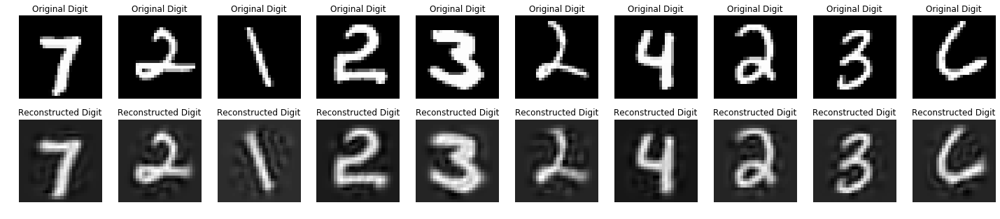

In [15]:
X_Val_pca_reconstruction = pca.inverse_transform(X_Val_pca)

reconstruction_error_list = []
random_indices = [random.randint(0, X_val_mnist.shape[0]) for i in range(10)] 
#random_indices = [432, 691, 549, 722, 472, 585, 242, 328, 42, 25]
fig = plt.figure(figsize=(25,5))
ax = fig.subplots(2, 10)
i=0
for index in random_indices:
    dec = X_Val_pca_reconstruction[index].reshape(28,28)  #The values can go below 0 and more than 1
    act = X_val_mnist[index].reshape(28,28)
    reconstruction_error_list.append(np.mean(((dec-act)*(dec-act))))
    ax[0,i].imshow(act, cmap='gray')
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Digit', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    ax[1,i].imshow(dec, cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Reconstructed Digit', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    i = i+1
print('PCA reconstruction error on the validation set: ' + str(np.round(np.sqrt(np.mean(reconstruction_error_list)),4)))
plt.show()

#### Auto-encoders on Grayscale Images

In [16]:
n_epochs = 50
n_batches = 256
encoding_dim = 100

inputs = Input(shape=(784,), name='input')                       #input layer
layer = Dense(encoding_dim*4,activation='linear')(inputs)
code = Dense(encoding_dim, activation='linear')(layer)       #hidden layer => represents codes
layer = Dense(encoding_dim*4,activation='linear')(code)
outputs = Dense(784, activation='softmax', name='output')(layer)  #output layer

#this model maps an input to its reconstruction
autoencoder = Model(inputs, outputs)
print(autoencoder.summary())

autoencoder.compile(optimizer='adam', loss='binary_crossentropy',metrics=['mean_squared_error'])
autoencoder.fit(X_train_mnist, X_train_mnist,epochs=n_epochs,batch_size=n_batches,shuffle=True,
                validation_data=(X_val_mnist, X_val_mnist))

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 784)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 400)               314000    
_________________________________________________________________
dense_2 (Dense)              (None, 100)               40100     
_________________________________________________________________
dense_3 (Dense)              (None, 400)               40400     
_________________________________________________________________
output (Dense)               (None, 784)               314384    
Total params: 708,884
Trainable params: 708,884
Non-trainable params: 0
_________________________________________________________________
None
Instructions for updating:
Use tf.cast instead.
Train on 60

Epoch 40/50
60000/60000 [==============================] - 9s 153us/step - loss: 0.6614 - mean_squared_error: 0.1100 - val_loss: 0.6722 - val_mean_squared_error: 0.1119
Epoch 41/50
60000/60000 [==============================] - 9s 150us/step - loss: 0.6614 - mean_squared_error: 0.1100 - val_loss: 0.6721 - val_mean_squared_error: 0.1119
Epoch 42/50
60000/60000 [==============================] - 9s 152us/step - loss: 0.6615 - mean_squared_error: 0.1100 - val_loss: 0.6721 - val_mean_squared_error: 0.1119
Epoch 43/50
60000/60000 [==============================] - 10s 163us/step - loss: 0.6614 - mean_squared_error: 0.1100 - val_loss: 0.6722 - val_mean_squared_error: 0.1119
Epoch 44/50
60000/60000 [==============================] - 12s 193us/step - loss: 0.6614 - mean_squared_error: 0.1100 - val_loss: 0.6721 - val_mean_squared_error: 0.1119
Epoch 45/50
60000/60000 [==============================] - 11s 185us/step - loss: 0.6614 - mean_squared_error: 0.1100 - val_loss: 0.6721 - val_mean_squar

#### Image Reconstruction using Auto-encoder

Auto-encoder reconstruction error on the validation aset: 0.3356


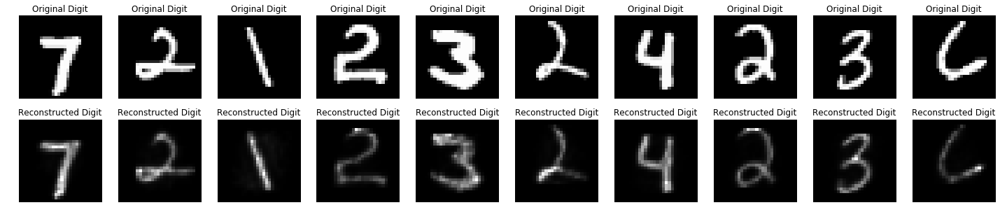

In [17]:
gray_val_pred = autoencoder.predict(X_val_mnist)

reconstruction_error_list = []
fig = plt.figure(figsize=(25,5))
ax = fig.subplots(2, 10)
i=0
for index in random_indices:
    dec = gray_val_pred[index].reshape(28,28) #Values stays between 0 & 1. Usually <<< 1
    act = X_val_mnist[index].reshape(28,28)
    reconstruction_error_list.append(np.mean(((dec-act)*(dec-act))))
    ax[0,i].imshow(act, cmap='gray')
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Digit', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    ax[1,i].imshow(dec, cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Reconstructed Digit', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    i = i+1
print('Auto-encoder reconstruction error on the validation aset: ' + str(np.round(np.sqrt(np.mean(reconstruction_error_list)),4)))
plt.show()

### PASCAL Dataset

#### PASCAL color to grayscale

In [18]:
X_Train_Gray = x_train.copy()
X_Val_Gray = x_val.copy()
X_Train_gray_list = []

for i in range(len(X_Train_Gray)):
    img = X_Train_Gray[i].reshape(img_rows,img_cols,n_channels)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    X_Train_gray_list.append(gray)

X_Val_gray_list = []
for i in range(len(X_Val_Gray)):
    img = X_Val_Gray[i].reshape(img_rows,img_cols,n_channels)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    X_Val_gray_list.append(gray)
    
df = pd.DataFrame()
df['Train_Gray'] = X_Train_gray_list

X_Train_gray_array = np.array(df['Train_Gray'].values.tolist())

df = pd.DataFrame()
df['Val_Gray'] = X_Val_gray_list
X_Val_gray_array = np.array(df['Val_Gray'].values.tolist())

X_Train_gray_array = X_Train_gray_array.astype('float32') / 255.
X_Val_gray_array = X_Val_gray_array.astype('float32') / 255.
X_Train_gray_array = X_Train_gray_array.reshape((X_Train_gray_array.shape[0], -1))
X_Val_gray_array = X_Val_gray_array.reshape((X_Val_gray_array.shape[0], -1))
print(X_Train_gray_array.shape)
print(X_Val_gray_array.shape)

(1489, 16384)
(735, 16384)


#### PCA Decomposition on Grayscale Images

In [19]:
n_components = 100

print("Extracting the top %d components from %d images"
      % (n_components, X_Train_gray_array.shape[0]))
t0 = time()
pca = PCA(n_components=n_components, svd_solver='randomized',
          whiten=True).fit(X_Train_gray_array)
print("done in %0.3fs" % (time() - t0))
t0 = time()
X_Train_pca = pca.transform(X_Train_gray_array)
X_Val_pca = pca.transform(X_Val_gray_array)
print("done in %0.3fs" % (time() - t0))

Extracting the top 100 components from 1489 images
done in 2.110s
done in 0.290s


#### Image Reconstruction Using PCA

PCA reconstruction error on the validation set: 0.1284


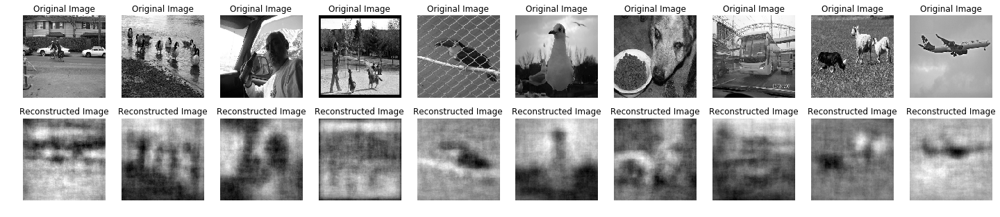

In [20]:
X_Val_pca_reconstruction = pca.inverse_transform(X_Val_pca)

reconstruction_error_list = []
random_indices = [random.randint(0, X_Val_gray_array.shape[0]) for i in range(10)] 
fig = plt.figure(figsize=(25,5))
ax = fig.subplots(2, 10)
i=0
for index in random_indices:
    dec = X_Val_pca_reconstruction[index].reshape(img_rows,img_cols)
    act = X_Val_gray_array[index].reshape(img_rows,img_cols)
    reconstruction_error_list.append(np.mean(((dec-act)*(dec-act))))
    ax[0,i].imshow(act, cmap='gray')
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    ax[1,i].imshow(dec, cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Reconstructed Image', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    i = i+1
print('PCA reconstruction error on the validation set: ' + str(np.round(np.sqrt(np.mean(reconstruction_error_list)),4)))
plt.show()

#### Auto-encoders on Grayscale Images

In [21]:
input_shape = img_rows*img_cols
n_epochs = 50
n_batches = 256

inputs = Input(shape=(input_shape,), name='input')                       #input layer
layer = Dense(encoding_dim*4,activation='linear')(inputs)
code = Dense(encoding_dim, activation='linear')(layer)       #hidden layer => represents codes
layer = Dense(encoding_dim*4,activation='linear')(code)
outputs = Dense(input_shape, activation='softmax', name='output')(layer)  #output layer

#this model maps an input to its reconstruction
autoencoder = Model(inputs, outputs)
print(autoencoder.summary())

autoencoder.compile(optimizer='adam', loss='binary_crossentropy',metrics=['mean_squared_error'])
autoencoder.fit(X_Train_gray_array, X_Train_gray_array,epochs=n_epochs,batch_size=n_batches,shuffle=True,
                validation_data=(X_Val_gray_array, X_Val_gray_array))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 16384)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 400)               6554000   
_________________________________________________________________
dense_5 (Dense)              (None, 100)               40100     
_________________________________________________________________
dense_6 (Dense)              (None, 400)               40400     
_________________________________________________________________
output (Dense)               (None, 16384)             6569984   
Total params: 13,204,484
Trainable params: 13,204,484
Non-trainable params: 0
_________________________________________________________________
None
Train on 1489 samples, validate on 735 samples
Epoch 1/50
1489/1489 [==============================] - 8s 5ms/step - loss: 4.

#### Image Reconstruction using Auto-encoder

Auto-encoder reconstruction error on the validation set: 0.518


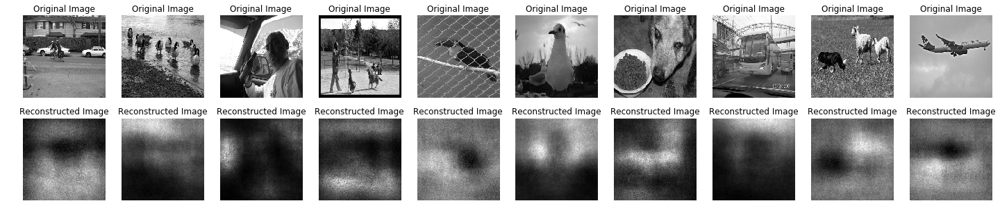

In [22]:
gray_val_pred = autoencoder.predict(X_Val_gray_array)

reconstruction_error_list = []
fig = plt.figure(figsize=(25,5))
ax = fig.subplots(2, 10)
i=0
for index in random_indices:
    dec = gray_val_pred[index].reshape(img_rows,img_cols)
    act = X_Val_gray_array[index].reshape(img_rows,img_cols)
    reconstruction_error_list.append(np.mean(((dec-act)*(dec-act))))
    ax[0,i].imshow(act, cmap='gray')
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    ax[1,i].imshow(dec, cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Reconstructed Image', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    i = i+1
print('Auto-encoder reconstruction error on the validation set: ' + str(np.round(np.sqrt(np.mean(reconstruction_error_list)),4)))
plt.show()

## Convolutional Auto-encoder

In [23]:
#CONV Auto-encoder
#Takes time. Run on Google Colab.
'''
n_epochs = 10
n_batches = 256

input_img = Input(shape=(img_rows, img_cols, n_channels))
layer = Conv2D(64, (3, 3), padding='same')(input_img)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = MaxPooling2D((2, 2), padding='same')(layer)
layer = Conv2D(32, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = MaxPooling2D((2, 2), padding='same')(layer)
layer = Conv2D(16, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
encoded = MaxPooling2D((2, 2), padding='same', name='code')(layer)

layer = Conv2D(16, (3, 3), padding='same')(encoded)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = UpSampling2D((2, 2))(layer)
layer = Conv2D(32, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = UpSampling2D((2, 2))(layer)
layer = Conv2D(64, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
layer = Activation('relu')(layer)
layer = UpSampling2D((2, 2))(layer)
layer = Conv2D(3, (3, 3), padding='same')(layer)
layer = BatchNormalization()(layer)
decoded = Activation('sigmoid')(layer)

conv_autoencoder = Model(input_img, decoded)
conv_autoencoder.compile(optimizer='adam', loss='binary_crossentropy',metrics=['mean_squared_error'])

history = conv_autoencoder.fit(x_train, x_train,epochs=n_epochs,batch_size=n_batches,verbose=1,
                               validation_data=(x_val, x_val),shuffle=True)

# serialize model to JSON
model_json = conv_autoencoder.to_json()
with open("conv_autoencoder.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
conv_autoencoder.save_weights("conv_autoencoder.h5")
with open('conv_autoencoder_history_dict', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

print("Saved model & history to disk")
'''

'\nn_epochs = 10\nn_batches = 256\n\ninput_img = Input(shape=(img_rows, img_cols, n_channels))\nlayer = Conv2D(64, (3, 3), padding=\'same\')(input_img)\nlayer = BatchNormalization()(layer)\nlayer = Activation(\'relu\')(layer)\nlayer = MaxPooling2D((2, 2), padding=\'same\')(layer)\nlayer = Conv2D(32, (3, 3), padding=\'same\')(layer)\nlayer = BatchNormalization()(layer)\nlayer = Activation(\'relu\')(layer)\nlayer = MaxPooling2D((2, 2), padding=\'same\')(layer)\nlayer = Conv2D(16, (3, 3), padding=\'same\')(layer)\nlayer = BatchNormalization()(layer)\nlayer = Activation(\'relu\')(layer)\nencoded = MaxPooling2D((2, 2), padding=\'same\', name=\'code\')(layer)\n\nlayer = Conv2D(16, (3, 3), padding=\'same\')(encoded)\nlayer = BatchNormalization()(layer)\nlayer = Activation(\'relu\')(layer)\nlayer = UpSampling2D((2, 2))(layer)\nlayer = Conv2D(32, (3, 3), padding=\'same\')(layer)\nlayer = BatchNormalization()(layer)\nlayer = Activation(\'relu\')(layer)\nlayer = UpSampling2D((2, 2))(layer)\nlayer

In [24]:
# load json and create model
json_file = open('conv_autoencoder.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
conv_autoencoder = model_from_json(loaded_model_json)
# load weights into new model
conv_autoencoder.load_weights("conv_autoencoder.h5")
print(conv_autoencoder.summary())
print("Loaded model from disk")

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      1792      
_________________________________________________________________
batch_normalization_1 (Batch (None, 128, 128, 64)      256       
_________________________________________________________________
activation_1 (Activation)    (None, 128, 128, 64)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 32)        18464     
_________________________________________________________________
batch_normalization_2 (Batch (None, 64, 64, 32)        128       
__________

code
(735, 16, 16, 16)


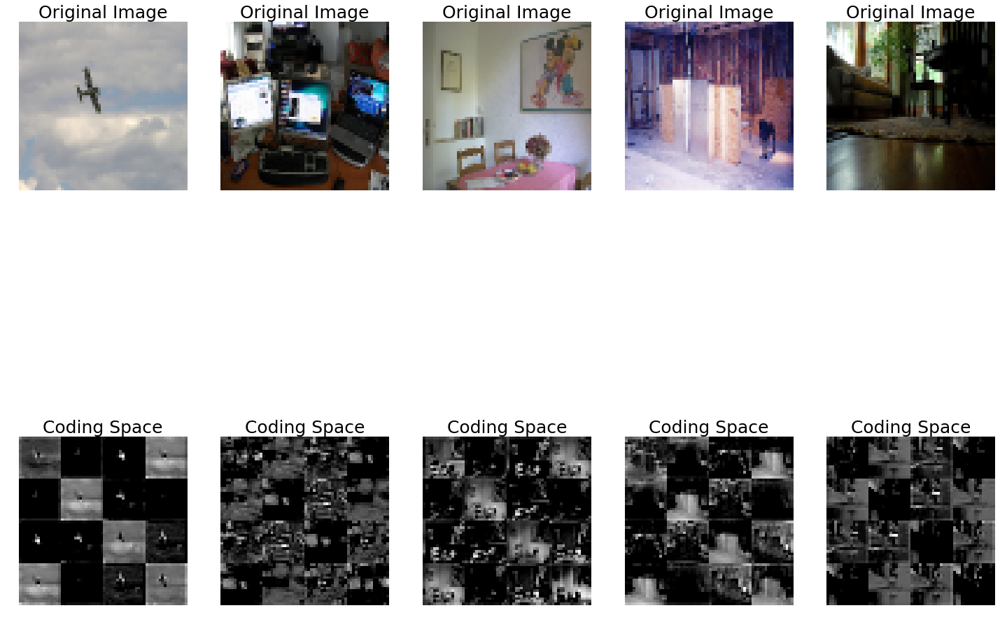

In [25]:
print(conv_autoencoder.layers[12].name)
coding_model = Model(inputs=conv_autoencoder.input, outputs=conv_autoencoder.layers[12].output)
coding_predictions = coding_model.predict(x_test)
print(np.shape(coding_predictions))

def get_coding_space(model_predictions,img_id):
    vStack = []
    for i in range(4):
        h_list = [model_predictions[img_id,:,:,((i+1)*(j+1))-1] for j in range(4)]
        h_tuple = tuple(h_list)
        vStack.append(np.hstack((h_tuple)))

    image_list = [tuple(vStack[j]) for j in range(4)]
    image = np.vstack((tuple(image_list)))
    return image

ran_idx = [random.randint(0, len(coding_predictions)) for i in range(5)] 
codingStack = []
actImgStack = []
for idx in ran_idx:
    coding_space = get_coding_space(coding_predictions,idx)
    codingStack.append(coding_space)
    actImgStack.append(cv2.resize(x_test[idx], dsize=(64,64)))

fig = plt.figure(figsize=(25,20))
ax = fig.subplots(2, 5)
i=0
for index in range(5):
    ax[0,i].imshow(actImgStack[index])
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[1,i].imshow(codingStack[index],cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Coding Space', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    i = i+1
plt.show()

Reconstruction error on entire dataset: 0.1569


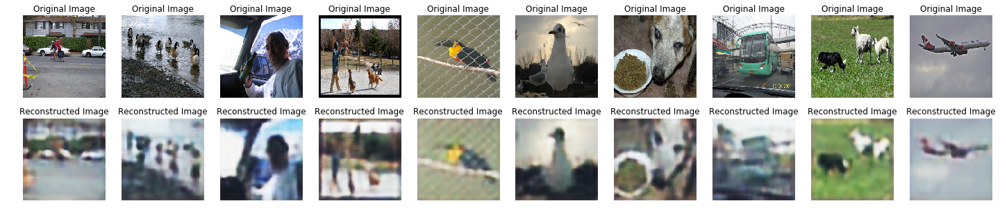

In [26]:
reconstruction_error_list = []
val_images = conv_autoencoder.predict(x_val)
fig = plt.figure(figsize=(25,5))
ax = fig.subplots(2, 10)
i=0
for index in random_indices:
    dec = val_images[index]
    act = x_val[index].astype('float32')/255.0
    reconstruction_error_list.append(np.mean(((dec-act)*(dec-act))))
    ax[0,i].imshow(act, cmap='gray')
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    ax[1,i].imshow(dec, cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Reconstructed Image', fontdict={'fontsize': 12, 'fontweight': 'medium'})
    i = i+1
print('Reconstruction error on entire dataset: ' + str(np.round(np.sqrt(np.mean(reconstruction_error_list)),4)))
plt.show()

# Object Classification

For comparing, the coding spaces for both the cases where finetuning is applied or not is shown below. For each image the coding layer returns 16x16 images with 16 colour channels. All the colour channels are plotted in grayscale.
<img src="encoder_codingspace.png">

### With freezing the encoder

In [27]:
#Use the encoder part of convolutional autoencoder & freeze the layers
conv_encoder = Model(conv_autoencoder.input,conv_autoencoder.layers[12].output)
print('Setting trainable to false')
for layer in conv_encoder.layers:
    layer.trainable = False  #Set the trainable to False
    
print(conv_encoder.summary())

Setting trainable to false
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      1792      
_________________________________________________________________
batch_normalization_1 (Batch (None, 128, 128, 64)      256       
_________________________________________________________________
activation_1 (Activation)    (None, 128, 128, 64)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 32)        18464     
_________________________________________________________________
batch_normalization_2 (Batch (None, 64, 64, 32)  

In [28]:
#Takes time. Run on Google Colab.
'''
dropout = 0.2  #Not really used
adam = Adam(lr=0.00001)
n_epochs = 50
n_batches = 256

conv_en_output = conv_encoder.output
conv_en_output = Flatten()(conv_en_output)

predictions = Dense(n_classes, activation='sigmoid')(conv_en_output)

finetune_model = Model(inputs=conv_encoder.input, outputs=predictions)
print(finetune_model.summary())

finetune_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy'])

history = finetune_model.fit(x_train, y_train, batch_size=n_batches,epochs=n_epochs,verbose=1,validation_data=(x_val, y_val),
shuffle=True)

# serialize model to JSON
model_json = finetune_model.to_json()
with open("finetune_model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
finetune_model.save_weights("finetune_model.h5")
with open('finetune_model_history_dict', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

print("Saved model & history to disk")
'''

'\ndropout = 0.2  #Not really used\nadam = Adam(lr=0.00001)\nn_epochs = 50\nn_batches = 256\n\nconv_en_output = conv_encoder.output\nconv_en_output = Flatten()(conv_en_output)\n\npredictions = Dense(n_classes, activation=\'sigmoid\')(conv_en_output)\n\nfinetune_model = Model(inputs=conv_encoder.input, outputs=predictions)\nprint(finetune_model.summary())\n\nfinetune_model.compile(optimizer=\'adam\', loss=\'binary_crossentropy\', metrics=[\'binary_accuracy\'])\n\nhistory = finetune_model.fit(x_train, y_train, batch_size=n_batches,epochs=n_epochs,verbose=1,validation_data=(x_val, y_val),\nshuffle=True)\n\n# serialize model to JSON\nmodel_json = finetune_model.to_json()\nwith open("finetune_model.json", "w") as json_file:\n    json_file.write(model_json)\n# serialize weights to HDF5\nfinetune_model.save_weights("finetune_model.h5")\nwith open(\'finetune_model_history_dict\', \'wb\') as file_pi:\n    pickle.dump(history.history, file_pi)\n\nprint("Saved model & history to disk")\n'

In [29]:
# load json and create model
json_file = open('finetune_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
finetune_model = model_from_json(loaded_model_json)
# load weights into new model
finetune_model.load_weights("finetune_model.h5")
print("Loaded model from disk")
finetune_model.summary()

Loaded model from disk
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      1792      
_________________________________________________________________
batch_normalization_1 (Batch (None, 128, 128, 64)      256       
_________________________________________________________________
activation_1 (Activation)    (None, 128, 128, 64)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 32)        18464     
_________________________________________________________________
batch_normalization_2 (Batch (None, 64, 64, 32)      

code
(735, 16, 16, 16)


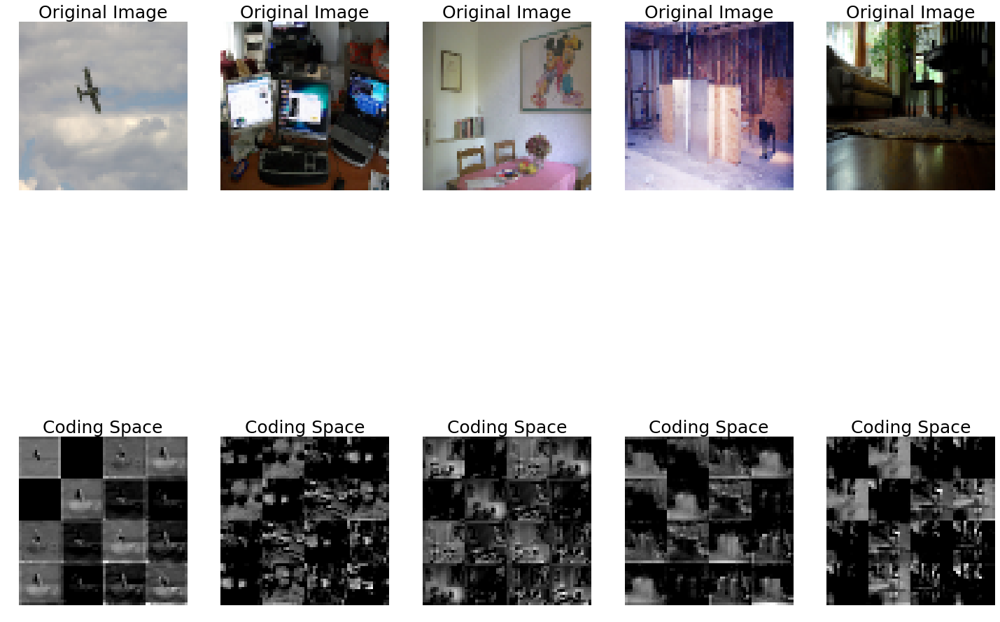

In [30]:
print(finetune_model.layers[12].name)
coding_model = Model(inputs=finetune_model.input, outputs=finetune_model.layers[12].output)
coding_predictions = coding_model.predict(x_test)
print(np.shape(coding_predictions))


codingStack = []
actImgStack = []
for idx in ran_idx:
    coding_space = get_coding_space(coding_predictions,idx)
    codingStack.append(coding_space)
    actImgStack.append(cv2.resize(x_test[idx], dsize=(64,64)))

fig = plt.figure(figsize=(25,20))
ax = fig.subplots(2, 5)
i=0
for index in range(5):
    ax[0,i].imshow(actImgStack[index])
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[1,i].imshow(codingStack[index],cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Coding Space', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    i = i+1
plt.show()

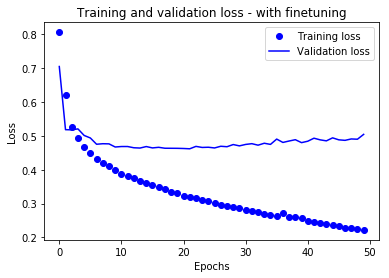

In [31]:
history = pd.read_pickle('finetune_model_history_dict')
loss = history['loss']
val_loss = history['val_loss']
epochs = range(n_epochs)
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss - with finetuning')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [32]:
#['aeroplane', 'car', 'chair', 'dog', 'bird']
y_predict_test = finetune_model.predict(x_test)

test_images_list = []
actual_y_test_list = []
predicted_probablities_y_test_list = []
predicted_y_test_list = []
count_unclassified = 0
for i in range(y_test.shape[0]):
    test_images_list.append(x_test[i])
    actual_y_test_list.append(y_test[i])
    predicted_probablities_y_test_list.append(y_predict_test[i])
    
    predicted = (y_predict_test[i]>0.5).astype(int)
    num_predicted_classes = predicted.sum()
    if(num_predicted_classes==0):
        arg_maxprob = np.argmax(y_predict_test[i])
        predicted[arg_maxprob] = 1
        count_unclassified = count_unclassified+1
    predicted_y_test_list.append(predicted)

df = pd.DataFrame()
df['Test_Images_Array'] = test_images_list
df['Actual'] = actual_y_test_list
df['Predict_Proba'] = predicted_probablities_y_test_list
df['Predicted'] = predicted_y_test_list
df['Confusion_Metrics'] = ''

for index,row in df.iterrows():
    a = row['Actual'] #Actual
    p = row['Predicted'] #Predicted
    TP, TN, FP, FN = 0, 0, 0, 0
    confu_metric_list = []
    for i in range(len(a)):
        if((a[i] == p[i]) & (a[i] == 1)):
            TP = TP + 1
            confu_metric_list.append('TP')
        if((a[i] == p[i]) & (a[i] == 0)):
            TN = TN + 1
            confu_metric_list.append('TN')
        if((a[i] != p[i]) & (a[i] == 1)):
            FN = FN + 1
            confu_metric_list.append('FN')
        if((a[i] != p[i]) & (a[i] == 0)):
            FP = FP + 1
            confu_metric_list.append('FP')
    df.at[index,'Confusion_Metrics'] = confu_metric_list
ft_df = df.copy()
print(df.shape)
print(count_unclassified)
df.head()

(735, 5)
296


,Test_Images_Array,Actual,Predict_Proba,Predicted,Confusion_Metrics
0,"[[[216, 220, 229], [216, 220, 229], [218, 222,...","[1, 0, 0, 0, 0]","[0.6187188, 0.06906161, 0.03685385, 0.1069096,...","[1, 0, 0, 0, 0]","[TP, TN, TN, TN, TN]"
1,"[[[9, 11, 8], [9, 11, 8], [7, 9, 7], [8, 10, 9...","[0, 0, 0, 1, 0]","[0.21015012, 0.010954082, 0.14487389, 0.642806...","[0, 0, 0, 1, 0]","[TN, TN, TN, TP, TN]"
2,"[[[59, 61, 47], [68, 71, 62], [73, 76, 68], [7...","[0, 1, 0, 0, 0]","[0.006891787, 0.5662339, 0.012256116, 0.249289...","[0, 1, 0, 0, 0]","[TN, TP, TN, TN, TN]"
3,"[[[33, 29, 18], [32, 28, 17], [33, 29, 17], [3...","[0, 0, 0, 0, 1]","[0.005214542, 0.009772748, 0.48785183, 0.25527...","[0, 0, 0, 0, 1]","[TN, TN, TN, TN, TP]"
4,"[[[113, 148, 174], [78, 101, 127], [45, 36, 42...","[0, 1, 0, 0, 0]","[0.705657, 0.73827404, 0.06269476, 0.023853898...","[1, 1, 0, 0, 0]","[FP, TP, TN, TN, TN]"


In [33]:
all_class_metric_list_of_dicts = []
for i in range(n_classes):
    metrics_dict = {}
    count_TP, count_TN, count_FP, count_FN = 0, 0, 0, 0
    for index,row in df.iterrows():
        if row['Confusion_Metrics'][i] == 'TP':
            count_TP = count_TP + 1
        if row['Confusion_Metrics'][i] == 'TN':
            count_TN = count_TN + 1
        if row['Confusion_Metrics'][i] == 'FP':
            count_FP = count_FP + 1
        if row['Confusion_Metrics'][i] == 'FN':
            count_FN = count_FN + 1
    metrics_dict['TP'] = count_TP
    metrics_dict['TN'] = count_TN
    metrics_dict['FP'] = count_FP
    metrics_dict['FN'] = count_FN
    all_class_metric_list_of_dicts.append(metrics_dict)
  
class_names = ['aeroplane', 'car', 'chair', 'dog', 'bird']
for i in range(len(all_class_metric_list_of_dicts)):
    all_class_metric_list_of_dicts[i]['Class_Name'] = class_names[i]
    dict = all_class_metric_list_of_dicts[i]
    accuracy = np.round(((dict['TP'] + dict['TN'])/(dict['TP'] + dict['TN'] + dict['FP'] + dict['FN'])),4)
    all_class_metric_list_of_dicts[i]['Accuracy'] = accuracy
    if (dict['TP']==0):
        precision = ''
        recall = ''
        f1 = ''
        print('Warning, number of true positives is 0 for class: ' + class_names[i])
    else:
        precision = np.round(dict['TP']/(dict['TP']+dict['FP']),4)
        recall = np.round(dict['TP']/(dict['TP']+dict['FN']),4)
        f1 = np.round((2 * (precision*recall)/(precision+recall)),4)
    all_class_metric_list_of_dicts[i]['Precision'] = precision
    all_class_metric_list_of_dicts[i]['Recall'] = recall
    all_class_metric_list_of_dicts[i]['F1'] = f1
  
finetuned_metric_df = pd.DataFrame(all_class_metric_list_of_dicts)
finetuned_metric_df = finetuned_metric_df[['Class_Name','TP','TN','FP','FN','Accuracy','Precision','Recall','F1']]
finetuned_metric_df

,Class_Name,TP,TN,FP,FN,Accuracy,Precision,Recall,F1
0,aeroplane,76,537,79,43,0.8340,0.4903,0.6387,0.5547
1,car,74,462,53,146,0.7293,0.5827,0.3364,0.4265
2,chair,66,479,90,100,0.7415,0.4231,0.3976,0.4100
3,dog,107,381,174,73,0.6639,0.3808,0.5944,0.4642
4,bird,30,569,52,84,0.8150,0.3659,0.2632,0.3062


In [34]:
#resize_dim*64 white image
img_rows, img_cols
hblank = np.zeros([img_rows,np.int(img_cols/3),n_channels],dtype=np.uint8)
hblank.fill(255) 
#hblank = cv2.cvtColor(hblank, cv2.COLOR_BGR2RGB)

def get_blank():
    #resize_dim*resize_dim white image
    blank = np.zeros([img_rows,img_cols,n_channels],dtype=np.uint8)
    blank.fill(255) 
    #blank = cv2.cvtColor(blank, cv2.COLOR_BGR2RGB)
    return blank

#filter = ['aeroplane', 'car', 'chair', 'dog', 'bird']['aeroplane', 'car', 'chair', 'dog', 'bird']
def write_on_blank(blank,act_list,pred_list):
    text = ' * Actual * \n'
    for i in range(len(act_list)):
        if(act_list[i]==1):
            text = text + str(filter[i]) + '\n'
    text = text + ' * Predicted * \n'
    for i in range(len(pred_list)):
        if(pred_list[i]==1):
            text = text + str(filter[i]) + '\n'
    for i, line in enumerate((text.split('\n'))):
        cv2.putText(blank,str(line),(5,15+i*20), cv2.FONT_HERSHEY_SIMPLEX, 0.5,(0,0,0),2,cv2.LINE_AA)
    return blank

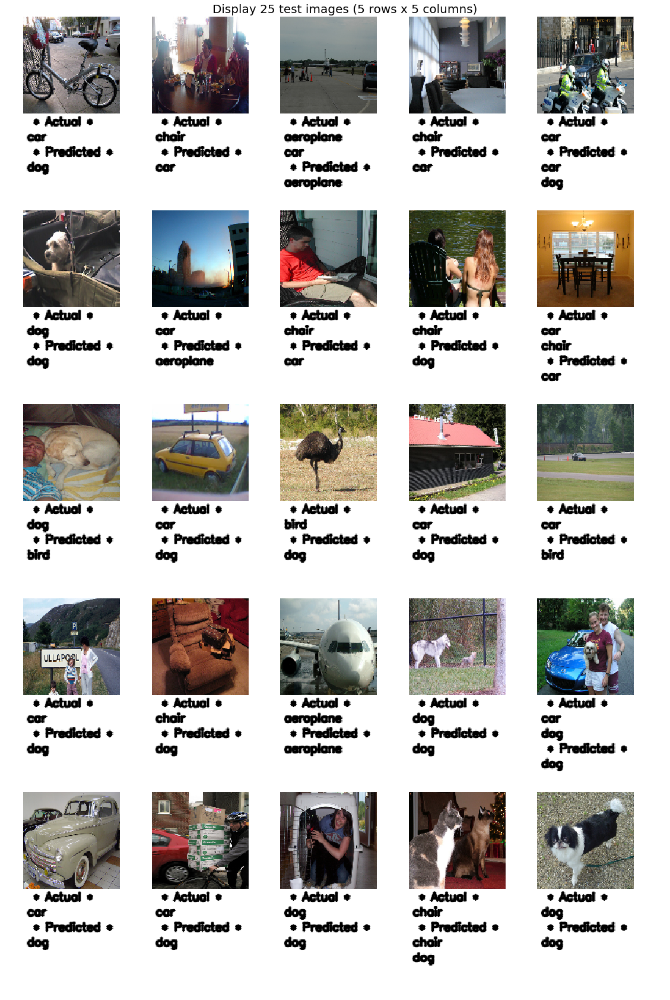

In [35]:
num_images = 25
random_indices = [random.randint(0, df.shape[0]) for i in range(num_images)] 

vStack = []
for j in range(5):
    h_list = []
    h_list_desc = []
    for i in range(5):
        img = df['Test_Images_Array'].iloc[random_indices[i+j*5]]
        act_y = df['Actual'].iloc[random_indices[i+j*5]]
        pred_y = df['Predicted'].iloc[random_indices[i+j*5]]
        h_list.append(img)
        h_list.append(hblank)  #Append blank images
        h_list_desc.append(write_on_blank(get_blank(),act_y,pred_y))
        h_list_desc.append(hblank)
    h_tuple = tuple(h_list)
    vStack.append(np.hstack((h_tuple)))
    h_desc_tuple = tuple(h_list_desc)
    vStack.append(np.hstack((h_desc_tuple)))

image_list = [tuple(vStack[j]) for j in range(len(vStack))]
image = np.vstack((tuple(image_list)))

plt.figure(figsize=(25,30))
plt.title('Display 25 test images (5 rows x 5 columns)', fontsize=20)
plt.axis('off')
plt.imsave('finetuned_predictions.png', image)
plt.imshow(image)

In [36]:
#finetuned model
#Row-wise precision & Recall calculation: Meaning metrics are calculated for each image (5 classes) & results are averaged
ft_df['Precision'] = ''
ft_df['Recall'] = ''
ft_df['F1'] = ''

for index,row in ft_df.iterrows():
    a = row['Actual'] #Actual
    p = row['Predicted'] #Predicted
    TP, TN, FP, FN = 0, 0, 0, 0
    for i in range(len(a)):
        if((a[i] == p[i]) & (a[i] == 1)):
            TP = TP + 1
        if((a[i] == p[i]) & (a[i] == 0)):
            TN = TN + 1
        if((a[i] != p[i]) & (a[i] == 1)):
            FN = FN + 1
        if((a[i] != p[i]) & (a[i] == 0)):
            FP = FP + 1
    precision = np.round(TP/(TP+FP),3)
    recall = np.round(TP/(TP+FN),3)
    f1 = np.round(2 * (precision*recall)/(precision+recall),3)
    ft_df.at[index,'Precision'] = precision
    ft_df.at[index,'Recall'] = recall
    ft_df.at[index,'F1'] = f1

print(ft_df.shape)
print(count_unclassified)
print('Mean of Precision: ' + str(np.round(ft_df['Precision'].mean(),4)))
print('Mean of Recall: ' + str(np.round(ft_df['Recall'].mean(),4)))
ft_df.head()

C:\Users\Triguna\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in double_scalars


(735, 8)
296
Mean of Precision: 0.4435
Mean of Recall: 0.4481


,Test_Images_Array,Actual,Predict_Proba,Predicted,Confusion_Metrics,Precision,Recall,F1
0,"[[[216, 220, 229], [216, 220, 229], [218, 222,...","[1, 0, 0, 0, 0]","[0.6187188, 0.06906161, 0.03685385, 0.1069096,...","[1, 0, 0, 0, 0]","[TP, TN, TN, TN, TN]",1,1,1
1,"[[[9, 11, 8], [9, 11, 8], [7, 9, 7], [8, 10, 9...","[0, 0, 0, 1, 0]","[0.21015012, 0.010954082, 0.14487389, 0.642806...","[0, 0, 0, 1, 0]","[TN, TN, TN, TP, TN]",1,1,1
2,"[[[59, 61, 47], [68, 71, 62], [73, 76, 68], [7...","[0, 1, 0, 0, 0]","[0.006891787, 0.5662339, 0.012256116, 0.249289...","[0, 1, 0, 0, 0]","[TN, TP, TN, TN, TN]",1,1,1
3,"[[[33, 29, 18], [32, 28, 17], [33, 29, 17], [3...","[0, 0, 0, 0, 1]","[0.005214542, 0.009772748, 0.48785183, 0.25527...","[0, 0, 0, 0, 1]","[TN, TN, TN, TN, TP]",1,1,1
4,"[[[113, 148, 174], [78, 101, 127], [45, 36, 42...","[0, 1, 0, 0, 0]","[0.705657, 0.73827404, 0.06269476, 0.023853898...","[1, 1, 0, 0, 0]","[FP, TP, TN, TN, TN]",0.5,1,0.667


### Without freezing the encoder

In [37]:
#Use the encoder part of convolutional autoencoder & DO NOT freeze the layers
conv_encoder = Model(conv_autoencoder.input,conv_autoencoder.layers[12].output)
print('Setting trainable to true')
for layer in conv_encoder.layers:
    layer.trainable = True  #Set the trainable to True
    
print(conv_encoder.summary())

Setting trainable to true
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      1792      
_________________________________________________________________
batch_normalization_1 (Batch (None, 128, 128, 64)      256       
_________________________________________________________________
activation_1 (Activation)    (None, 128, 128, 64)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 32)        18464     
_________________________________________________________________
batch_normalization_2 (Batch (None, 64, 64, 32)   

In [38]:
#Takes time. Run on Google Colab.
'''
dropout = 0.2  #Not really used
adam = Adam(lr=0.00001)

conv_en_output = conv_encoder.output
conv_en_output = Flatten()(conv_en_output)

predictions = Dense(n_classes, activation='sigmoid')(conv_en_output)

without_finetune_model = Model(inputs=conv_encoder.input, outputs=predictions)
print(without_finetune_model.summary())

without_finetune_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy'])

history = without_finetune_model.fit(x_train, y_train, batch_size=256,epochs=50,verbose=1,validation_data=(x_val,y_val),
shuffle=True)


# serialize model to JSON
model_json = without_finetune_model.to_json()
with open("without_finetune_model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
without_finetune_model.save_weights("without_finetune_model.h5")
with open('without_finetune_model_history_dict', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

print("Saved model & history to disk")
'''

'\ndropout = 0.2  #Not really used\nadam = Adam(lr=0.00001)\n\nconv_en_output = conv_encoder.output\nconv_en_output = Flatten()(conv_en_output)\n\npredictions = Dense(n_classes, activation=\'sigmoid\')(conv_en_output)\n\nwithout_finetune_model = Model(inputs=conv_encoder.input, outputs=predictions)\nprint(without_finetune_model.summary())\n\nwithout_finetune_model.compile(optimizer=\'adam\', loss=\'binary_crossentropy\', metrics=[\'binary_accuracy\'])\n\nhistory = without_finetune_model.fit(x_train, y_train, batch_size=256,epochs=50,verbose=1,validation_data=(x_val,y_val),\nshuffle=True)\n\n\n# serialize model to JSON\nmodel_json = without_finetune_model.to_json()\nwith open("without_finetune_model.json", "w") as json_file:\n    json_file.write(model_json)\n# serialize weights to HDF5\nwithout_finetune_model.save_weights("without_finetune_model.h5")\nwith open(\'without_finetune_model_history_dict\', \'wb\') as file_pi:\n    pickle.dump(history.history, file_pi)\n\nprint("Saved model &

In [39]:
# load json and create model
json_file = open('without_finetune_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
without_finetune_model = model_from_json(loaded_model_json)
# load weights into new model
without_finetune_model.load_weights("without_finetune_model.h5")
print("Loaded model from disk")
without_finetune_model.summary()

Loaded model from disk
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      1792      
_________________________________________________________________
batch_normalization_1 (Batch (None, 128, 128, 64)      256       
_________________________________________________________________
activation_1 (Activation)    (None, 128, 128, 64)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 32)        18464     
_________________________________________________________________
batch_normalization_2 (Batch (None, 64, 64, 32)      

code
(735, 16, 16, 16)


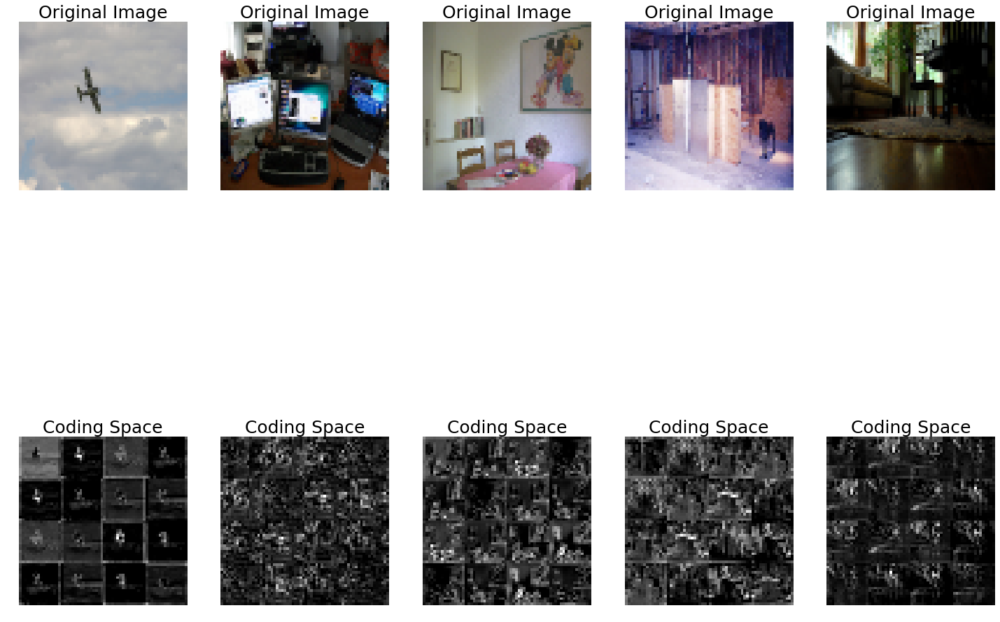

In [40]:
print(without_finetune_model.layers[12].name)
coding_model = Model(inputs=without_finetune_model.input, outputs=without_finetune_model.layers[12].output)
coding_predictions = coding_model.predict(x_test)
print(np.shape(coding_predictions))


codingStack = []
actImgStack = []
for idx in ran_idx:
    coding_space = get_coding_space(coding_predictions,idx)
    codingStack.append(coding_space)
    actImgStack.append(cv2.resize(x_test[idx], dsize=(64,64)))

fig = plt.figure(figsize=(25,20))
ax = fig.subplots(2, 5)
i=0
for index in range(5):
    ax[0,i].imshow(actImgStack[index])
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[1,i].imshow(codingStack[index],cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Coding Space', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    i = i+1
plt.show()

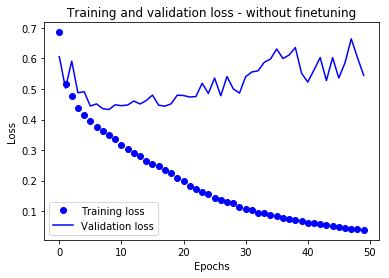

In [41]:
history = pd.read_pickle('without_finetune_model_history_dict')
loss = history['loss']
val_loss = history['val_loss']
epochs = range(n_epochs)
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss - without finetuning')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [42]:
#['aeroplane', 'car', 'chair', 'dog', 'bird']
y_predict_test = without_finetune_model.predict(x_test)

test_images_list = []
actual_y_test_list = []
predicted_probablities_y_test_list = []
predicted_y_test_list = []
count_unclassified = 0
for i in range(y_test.shape[0]):
    test_images_list.append(x_test[i])
    actual_y_test_list.append(y_test[i])
    predicted_probablities_y_test_list.append(y_predict_test[i])
    
    predicted = (y_predict_test[i]>0.5).astype(int)
    num_predicted_classes = predicted.sum()
    if(num_predicted_classes==0):
        arg_maxprob = np.argmax(y_predict_test[i])
        predicted[arg_maxprob] = 1
        count_unclassified = count_unclassified+1
    predicted_y_test_list.append(predicted)

df = pd.DataFrame()
df['Test_Images_Array'] = test_images_list
df['Actual'] = actual_y_test_list
df['Predict_Proba'] = predicted_probablities_y_test_list
df['Predicted'] = predicted_y_test_list
df['Confusion_Metrics'] = ''

for index,row in df.iterrows():
    a = row['Actual'] #Actual
    p = row['Predicted'] #Predicted
    TP, TN, FP, FN = 0, 0, 0, 0
    confu_metric_list = []
    for i in range(len(a)):
        if((a[i] == p[i]) & (a[i] == 1)):
            TP = TP + 1
            confu_metric_list.append('TP')
        if((a[i] == p[i]) & (a[i] == 0)):
            TN = TN + 1
            confu_metric_list.append('TN')
        if((a[i] != p[i]) & (a[i] == 1)):
            FN = FN + 1
            confu_metric_list.append('FN')
        if((a[i] != p[i]) & (a[i] == 0)):
            FP = FP + 1
            confu_metric_list.append('FP')
    df.at[index,'Confusion_Metrics'] = confu_metric_list
without_ft_df = df.copy()
print(df.shape)
print(count_unclassified)
df.head()

(735, 5)
392


,Test_Images_Array,Actual,Predict_Proba,Predicted,Confusion_Metrics
0,"[[[216, 220, 229], [216, 220, 229], [218, 222,...","[1, 0, 0, 0, 0]","[0.2441583, 0.09211385, 0.008819193, 0.0045194...","[1, 0, 0, 0, 0]","[TP, TN, TN, TN, TN]"
1,"[[[9, 11, 8], [9, 11, 8], [7, 9, 7], [8, 10, 9...","[0, 0, 0, 1, 0]","[0.00045832992, 0.0007827282, 0.0009737313, 0....","[0, 0, 0, 1, 1]","[TN, TN, TN, TP, FP]"
2,"[[[59, 61, 47], [68, 71, 62], [73, 76, 68], [7...","[0, 1, 0, 0, 0]","[0.0025219917, 0.62282705, 7.1555376e-05, 0.07...","[0, 1, 0, 0, 0]","[TN, TP, TN, TN, TN]"
3,"[[[33, 29, 18], [32, 28, 17], [33, 29, 17], [3...","[0, 0, 0, 0, 1]","[0.0003068745, 0.008922607, 0.00029680133, 0.0...","[0, 0, 0, 0, 1]","[TN, TN, TN, TN, TP]"
4,"[[[113, 148, 174], [78, 101, 127], [45, 36, 42...","[0, 1, 0, 0, 0]","[0.10181618, 0.40064216, 0.0016043782, 0.00117...","[0, 1, 0, 0, 0]","[TN, TP, TN, TN, TN]"


In [43]:
all_class_metric_list_of_dicts = []
for i in range(n_classes):
    metrics_dict = {}
    count_TP, count_TN, count_FP, count_FN = 0, 0, 0, 0
    for index,row in df.iterrows():
        if row['Confusion_Metrics'][i] == 'TP':
            count_TP = count_TP + 1
        if row['Confusion_Metrics'][i] == 'TN':
            count_TN = count_TN + 1
        if row['Confusion_Metrics'][i] == 'FP':
            count_FP = count_FP + 1
        if row['Confusion_Metrics'][i] == 'FN':
            count_FN = count_FN + 1
    metrics_dict['TP'] = count_TP
    metrics_dict['TN'] = count_TN
    metrics_dict['FP'] = count_FP
    metrics_dict['FN'] = count_FN
    all_class_metric_list_of_dicts.append(metrics_dict)
  
class_names = ['aeroplane', 'car', 'chair', 'dog', 'bird']
for i in range(len(all_class_metric_list_of_dicts)):
    all_class_metric_list_of_dicts[i]['Class_Name'] = class_names[i]
    dict = all_class_metric_list_of_dicts[i]
    accuracy = np.round(((dict['TP'] + dict['TN'])/(dict['TP'] + dict['TN'] + dict['FP'] + dict['FN'])),4)
    all_class_metric_list_of_dicts[i]['Accuracy'] = accuracy
    if (dict['TP']==0):
        precision = ''
        recall = ''
        f1 = ''
        print('Warning, number of true positives is 0 for class: ' + class_names[i])
    else:
        precision = np.round(dict['TP']/(dict['TP']+dict['FP']),4)
        recall = np.round(dict['TP']/(dict['TP']+dict['FN']),4)
        f1 = np.round((2 * (precision*recall)/(precision+recall)),4)
    all_class_metric_list_of_dicts[i]['Precision'] = precision
    all_class_metric_list_of_dicts[i]['Recall'] = recall
    all_class_metric_list_of_dicts[i]['F1'] = f1
  
without_fine_tuned_metric_df = pd.DataFrame(all_class_metric_list_of_dicts)
without_fine_tuned_metric_df = without_fine_tuned_metric_df[['Class_Name','TP','TN','FP','FN','Accuracy','Precision','Recall','F1']]
without_fine_tuned_metric_df

,Class_Name,TP,TN,FP,FN,Accuracy,Precision,Recall,F1
0,aeroplane,63,589,27,56,0.8871,0.7000,0.5294,0.6029
1,car,88,468,47,132,0.7565,0.6519,0.4000,0.4958
2,chair,45,547,22,121,0.8054,0.6716,0.2711,0.3863
3,dog,115,459,96,65,0.7810,0.5450,0.6389,0.5882
4,bird,79,438,183,35,0.7034,0.3015,0.6930,0.4202


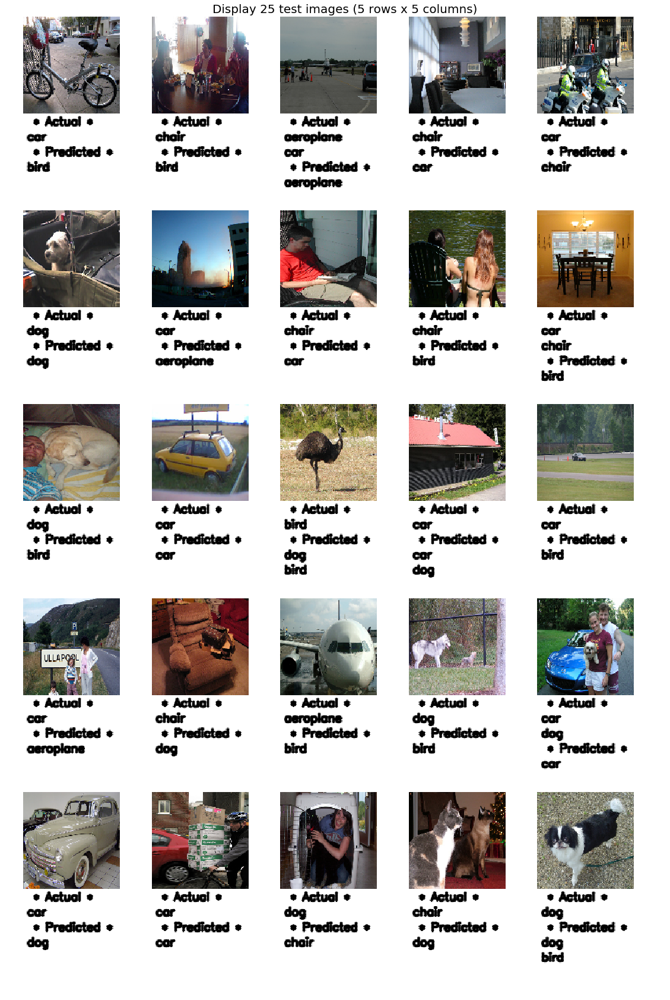

In [44]:
vStack = []
for j in range(5):
    h_list = []
    h_list_desc = []
    for i in range(5):
        img = df['Test_Images_Array'].iloc[random_indices[i+j*5]]
        act_y = df['Actual'].iloc[random_indices[i+j*5]]
        pred_y = df['Predicted'].iloc[random_indices[i+j*5]]
        h_list.append(img)
        h_list.append(hblank)  #Append blank images
        h_list_desc.append(write_on_blank(get_blank(),act_y,pred_y))
        h_list_desc.append(hblank)
    h_tuple = tuple(h_list)
    vStack.append(np.hstack((h_tuple)))
    h_desc_tuple = tuple(h_list_desc)
    vStack.append(np.hstack((h_desc_tuple)))

image_list = [tuple(vStack[j]) for j in range(len(vStack))]
image = np.vstack((tuple(image_list)))

plt.figure(figsize=(25,30))
plt.title('Display 25 test images (5 rows x 5 columns)', fontsize=20)
plt.axis('off')
plt.imsave('without_finetuned_predictions.png', image)
plt.imshow(image)

In [45]:
#without finetuned model
#Row-wise precision & Recall calculation: Meaning metrics are calculated for each image (5 classes) & results are averaged
without_ft_df['Precision'] = ''
without_ft_df['Recall'] = ''
without_ft_df['F1'] = ''

for index,row in without_ft_df.iterrows():
    a = row['Actual'] #Actual
    p = row['Predicted'] #Predicted
    TP, TN, FP, FN = 0, 0, 0, 0
    for i in range(len(a)):
        if((a[i] == p[i]) & (a[i] == 1)):
            TP = TP + 1
        if((a[i] == p[i]) & (a[i] == 0)):
            TN = TN + 1
        if((a[i] != p[i]) & (a[i] == 1)):
            FN = FN + 1
        if((a[i] != p[i]) & (a[i] == 0)):
            FP = FP + 1
    precision = np.round(TP/(TP+FP),3)
    recall = np.round(TP/(TP+FN),3)
    f1 = np.round(2 * (precision*recall)/(precision+recall),3)
    without_ft_df.at[index,'Precision'] = precision
    without_ft_df.at[index,'Recall'] = recall
    without_ft_df.at[index,'F1'] = f1

print(without_ft_df.shape)
print(count_unclassified)
print('Mean of Precision: ' + str(np.round(without_ft_df['Precision'].mean(),4)))
print('Mean of Recall: ' + str(np.round(without_ft_df['Recall'].mean(),4)))
without_ft_df.head()

C:\Users\Triguna\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in double_scalars


(735, 8)
392
Mean of Precision: 0.5102
Mean of Recall: 0.5039


,Test_Images_Array,Actual,Predict_Proba,Predicted,Confusion_Metrics,Precision,Recall,F1
0,"[[[216, 220, 229], [216, 220, 229], [218, 222,...","[1, 0, 0, 0, 0]","[0.2441583, 0.09211385, 0.008819193, 0.0045194...","[1, 0, 0, 0, 0]","[TP, TN, TN, TN, TN]",1,1,1
1,"[[[9, 11, 8], [9, 11, 8], [7, 9, 7], [8, 10, 9...","[0, 0, 0, 1, 0]","[0.00045832992, 0.0007827282, 0.0009737313, 0....","[0, 0, 0, 1, 1]","[TN, TN, TN, TP, FP]",0.5,1,0.667
2,"[[[59, 61, 47], [68, 71, 62], [73, 76, 68], [7...","[0, 1, 0, 0, 0]","[0.0025219917, 0.62282705, 7.1555376e-05, 0.07...","[0, 1, 0, 0, 0]","[TN, TP, TN, TN, TN]",1,1,1
3,"[[[33, 29, 18], [32, 28, 17], [33, 29, 17], [3...","[0, 0, 0, 0, 1]","[0.0003068745, 0.008922607, 0.00029680133, 0.0...","[0, 0, 0, 0, 1]","[TN, TN, TN, TN, TP]",1,1,1
4,"[[[113, 148, 174], [78, 101, 127], [45, 36, 42...","[0, 1, 0, 0, 0]","[0.10181618, 0.40064216, 0.0016043782, 0.00117...","[0, 1, 0, 0, 0]","[TN, TP, TN, TN, TN]",1,1,1


# Object Classification Using Autoencoder's Reconstructed Output

Here the output of the encoder is used as features for object classification instead of the output of the code layer.

For comparing, the coding spaces for both the cases where finetuning is applied or not is shown below. For each image the coding layer returns 16x16 images with 16 colour channels. All the colour channels are plotted in grayscale.
<img src="autoencoder_codingspace.png">

### With finetuning

In [46]:
conv_encoder = Model(conv_autoencoder.input,conv_autoencoder.output)#Select all layers of the autoencoder
print('Setting trainable to false')
for layer in conv_encoder.layers:
    layer.trainable = False  #Set the trainable to False

Setting trainable to false


In [47]:
#Takes time. Run on Google Colab.
'''
dropout = 0.2  #Not really used
adam = Adam(lr=0.00001)
n_epochs = 50
n_batches = 256

conv_en_output = conv_encoder.output
conv_en_output = Flatten()(conv_en_output)

predictions = Dense(n_classes, activation='sigmoid')(conv_en_output)

aeo_finetune_model = Model(inputs=conv_encoder.input, outputs=predictions) #aeo - Autoencoder output
print(aeo_finetune_model.summary())

aeo_finetune_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy'])

history = aeo_finetune_model.fit(x_train, y_train, batch_size=n_batches,epochs=n_epochs,verbose=1,validation_data=(x_val, y_val),
shuffle=True)

# serialize model to JSON
model_json = aeo_finetune_model.to_json()
with open("Computer_Vision_Project/aeo_finetune_model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
aeo_finetune_model.save_weights("Computer_Vision_Project/aeo_finetune_model.h5")
with open('Computer_Vision_Project/aeo_finetune_model_history_dict', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

print("Saved model & history to disk")
plot_model(aeo_finetune_model, to_file='aeo_finetune_model.png')
'''

'\ndropout = 0.2  #Not really used\nadam = Adam(lr=0.00001)\nn_epochs = 50\nn_batches = 256\n\nconv_en_output = conv_encoder.output\nconv_en_output = Flatten()(conv_en_output)\n\npredictions = Dense(n_classes, activation=\'sigmoid\')(conv_en_output)\n\naeo_finetune_model = Model(inputs=conv_encoder.input, outputs=predictions) #aeo - Autoencoder output\nprint(aeo_finetune_model.summary())\n\naeo_finetune_model.compile(optimizer=\'adam\', loss=\'binary_crossentropy\', metrics=[\'binary_accuracy\'])\n\nhistory = aeo_finetune_model.fit(x_train, y_train, batch_size=n_batches,epochs=n_epochs,verbose=1,validation_data=(x_val, y_val),\nshuffle=True)\n\n# serialize model to JSON\nmodel_json = aeo_finetune_model.to_json()\nwith open("Computer_Vision_Project/aeo_finetune_model.json", "w") as json_file:\n    json_file.write(model_json)\n# serialize weights to HDF5\naeo_finetune_model.save_weights("Computer_Vision_Project/aeo_finetune_model.h5")\nwith open(\'Computer_Vision_Project/aeo_finetune_mod

In [48]:
# load json and create model
json_file = open('aeo_finetune_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
aeo_finetune_model = model_from_json(loaded_model_json)
# load weights into new model
aeo_finetune_model.load_weights("aeo_finetune_model.h5")
print("Loaded model from disk")

Loaded model from disk


code
(735, 16, 16, 16)


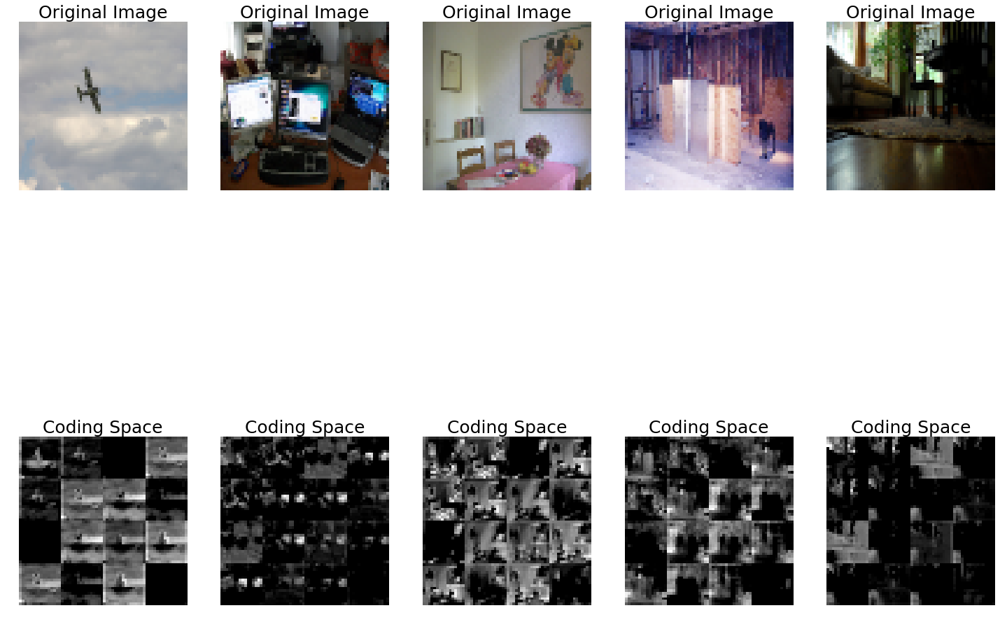

In [49]:
print(aeo_finetune_model.layers[12].name)
coding_model = Model(inputs=aeo_finetune_model.input, outputs=aeo_finetune_model.layers[12].output)
coding_predictions = coding_model.predict(x_test)
print(np.shape(coding_predictions))


codingStack = []
actImgStack = []
for idx in ran_idx:
    coding_space = get_coding_space(coding_predictions,idx)
    codingStack.append(coding_space)
    actImgStack.append(cv2.resize(x_test[idx], dsize=(64,64)))

fig = plt.figure(figsize=(25,20))
ax = fig.subplots(2, 5)
i=0
for index in range(5):
    ax[0,i].imshow(actImgStack[index])
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[1,i].imshow(codingStack[index],cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Coding Space', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    i = i+1
plt.show()

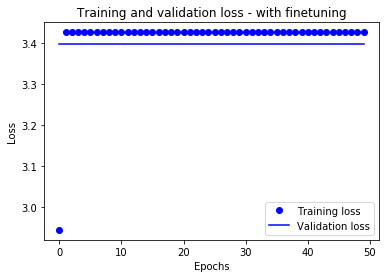

In [50]:
history = pd.read_pickle('aeo_finetune_model_history_dict')
loss = history['loss']
val_loss = history['val_loss']
epochs = range(n_epochs)
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss - with finetuning')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [51]:
#['aeroplane', 'car', 'chair', 'dog', 'bird']
y_predict_test = aeo_finetune_model.predict(x_test)

test_images_list = []
actual_y_test_list = []
predicted_probablities_y_test_list = []
predicted_y_test_list = []
count_unclassified = 0
for i in range(y_test.shape[0]):
    test_images_list.append(x_test[i])
    actual_y_test_list.append(y_test[i])
    predicted_probablities_y_test_list.append(y_predict_test[i])
    
    predicted = (y_predict_test[i]>0.5).astype(int)
    num_predicted_classes = predicted.sum()
    if(num_predicted_classes==0):
        arg_maxprob = np.argmax(y_predict_test[i])
        predicted[arg_maxprob] = 1
        count_unclassified = count_unclassified+1
    predicted_y_test_list.append(predicted)

df = pd.DataFrame()
df['Test_Images_Array'] = test_images_list
df['Actual'] = actual_y_test_list
df['Predict_Proba'] = predicted_probablities_y_test_list
df['Predicted'] = predicted_y_test_list
df['Confusion_Metrics'] = ''

for index,row in df.iterrows():
    a = row['Actual'] #Actual
    p = row['Predicted'] #Predicted
    TP, TN, FP, FN = 0, 0, 0, 0
    confu_metric_list = []
    for i in range(len(a)):
        if((a[i] == p[i]) & (a[i] == 1)):
            TP = TP + 1
            confu_metric_list.append('TP')
        if((a[i] == p[i]) & (a[i] == 0)):
            TN = TN + 1
            confu_metric_list.append('TN')
        if((a[i] != p[i]) & (a[i] == 1)):
            FN = FN + 1
            confu_metric_list.append('FN')
        if((a[i] != p[i]) & (a[i] == 0)):
            FP = FP + 1
            confu_metric_list.append('FP')
    df.at[index,'Confusion_Metrics'] = confu_metric_list
ft_df = df.copy()
print(df.shape)
print(count_unclassified)
df.head()

(735, 5)
735


,Test_Images_Array,Actual,Predict_Proba,Predicted,Confusion_Metrics
0,"[[[216, 220, 229], [216, 220, 229], [218, 222,...","[1, 0, 0, 0, 0]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[TP, TN, TN, TN, TN]"
1,"[[[9, 11, 8], [9, 11, 8], [7, 9, 7], [8, 10, 9...","[0, 0, 0, 1, 0]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, TN, TN, FN, TN]"
2,"[[[59, 61, 47], [68, 71, 62], [73, 76, 68], [7...","[0, 1, 0, 0, 0]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, FN, TN, TN, TN]"
3,"[[[33, 29, 18], [32, 28, 17], [33, 29, 17], [3...","[0, 0, 0, 0, 1]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, TN, TN, TN, FN]"
4,"[[[113, 148, 174], [78, 101, 127], [45, 36, 42...","[0, 1, 0, 0, 0]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, FN, TN, TN, TN]"


In [52]:
all_class_metric_list_of_dicts = []
for i in range(n_classes):
    metrics_dict = {}
    count_TP, count_TN, count_FP, count_FN = 0, 0, 0, 0
    for index,row in df.iterrows():
        if row['Confusion_Metrics'][i] == 'TP':
            count_TP = count_TP + 1
        if row['Confusion_Metrics'][i] == 'TN':
            count_TN = count_TN + 1
        if row['Confusion_Metrics'][i] == 'FP':
            count_FP = count_FP + 1
        if row['Confusion_Metrics'][i] == 'FN':
            count_FN = count_FN + 1
    metrics_dict['TP'] = count_TP
    metrics_dict['TN'] = count_TN
    metrics_dict['FP'] = count_FP
    metrics_dict['FN'] = count_FN
    all_class_metric_list_of_dicts.append(metrics_dict)
  
class_names = ['aeroplane', 'car', 'chair', 'dog', 'bird']
for i in range(len(all_class_metric_list_of_dicts)):
    all_class_metric_list_of_dicts[i]['Class_Name'] = class_names[i]
    dict = all_class_metric_list_of_dicts[i]
    accuracy = np.round(((dict['TP'] + dict['TN'])/(dict['TP'] + dict['TN'] + dict['FP'] + dict['FN'])),4)
    all_class_metric_list_of_dicts[i]['Accuracy'] = accuracy
    if (dict['TP']==0):
        precision = ''
        recall = ''
        f1 = ''
        print('Warning, number of true positives is 0 for class: ' + class_names[i])
    else:
        precision = np.round(dict['TP']/(dict['TP']+dict['FP']),4)
        recall = np.round(dict['TP']/(dict['TP']+dict['FN']),4)
        f1 = np.round((2 * (precision*recall)/(precision+recall)),4)
    all_class_metric_list_of_dicts[i]['Precision'] = precision
    all_class_metric_list_of_dicts[i]['Recall'] = recall
    all_class_metric_list_of_dicts[i]['F1'] = f1
  
finetuned_metric_df = pd.DataFrame(all_class_metric_list_of_dicts)
finetuned_metric_df = finetuned_metric_df[['Class_Name','TP','TN','FP','FN','Accuracy','Precision','Recall','F1']]
finetuned_metric_df

Warning, number of true positives is 0 for class: car
Warning, number of true positives is 0 for class: chair
Warning, number of true positives is 0 for class: dog
Warning, number of true positives is 0 for class: bird


,Class_Name,TP,TN,FP,FN,Accuracy,Precision,Recall,F1
0,aeroplane,119,0,616,0,0.1619,0.1619,1,0.2787
1,car,0,515,0,220,0.7007,,,
2,chair,0,569,0,166,0.7741,,,
3,dog,0,555,0,180,0.7551,,,
4,bird,0,621,0,114,0.8449,,,


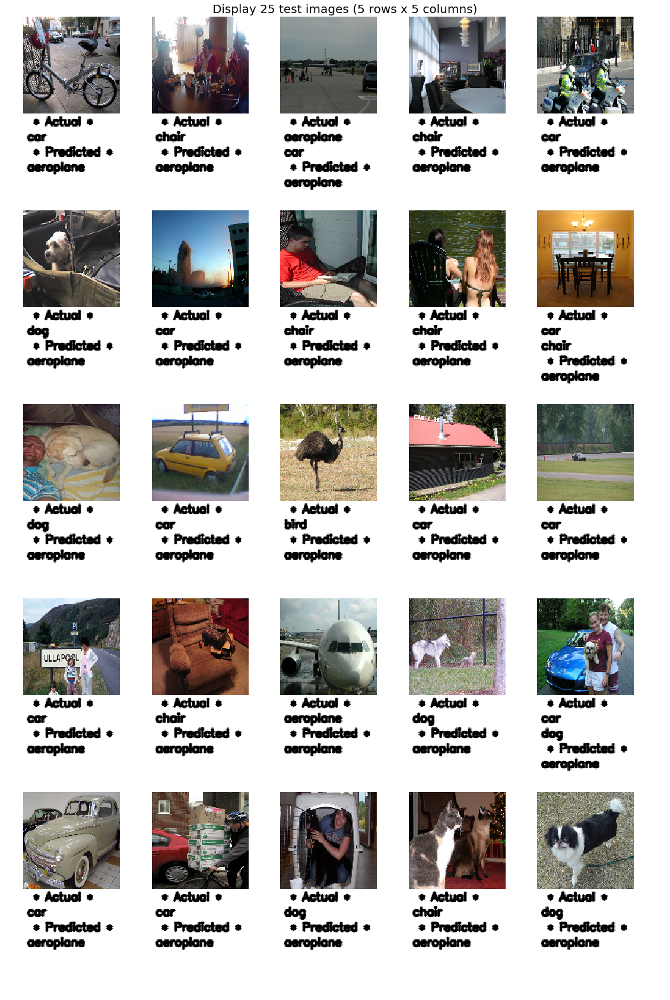

In [53]:
vStack = []
for j in range(5):
    h_list = []
    h_list_desc = []
    for i in range(5):
        img = df['Test_Images_Array'].iloc[random_indices[i+j*5]]
        act_y = df['Actual'].iloc[random_indices[i+j*5]]
        pred_y = df['Predicted'].iloc[random_indices[i+j*5]]
        h_list.append(img)
        h_list.append(hblank)  #Append blank images
        h_list_desc.append(write_on_blank(get_blank(),act_y,pred_y))
        h_list_desc.append(hblank)
    h_tuple = tuple(h_list)
    vStack.append(np.hstack((h_tuple)))
    h_desc_tuple = tuple(h_list_desc)
    vStack.append(np.hstack((h_desc_tuple)))

image_list = [tuple(vStack[j]) for j in range(len(vStack))]
image = np.vstack((tuple(image_list)))

plt.figure(figsize=(25,30))
plt.title('Display 25 test images (5 rows x 5 columns)', fontsize=20)
plt.axis('off')
plt.imsave('aeo_finetuned_predictions.png', image)
plt.imshow(image)

In [54]:
#finetuned model
#Row-wise precision & Recall calculation: Meaning metrics are calculated for each image (5 classes) & results are averaged
ft_df['Precision'] = ''
ft_df['Recall'] = ''
ft_df['F1'] = ''

for index,row in ft_df.iterrows():
    a = row['Actual'] #Actual
    p = row['Predicted'] #Predicted
    TP, TN, FP, FN = 0, 0, 0, 0
    for i in range(len(a)):
        if((a[i] == p[i]) & (a[i] == 1)):
            TP = TP + 1
        if((a[i] == p[i]) & (a[i] == 0)):
            TN = TN + 1
        if((a[i] != p[i]) & (a[i] == 1)):
            FN = FN + 1
        if((a[i] != p[i]) & (a[i] == 0)):
            FP = FP + 1
    precision = np.round(TP/(TP+FP),3)
    recall = np.round(TP/(TP+FN),3)
    f1 = np.round(2 * (precision*recall)/(precision+recall),3)
    ft_df.at[index,'Precision'] = precision
    ft_df.at[index,'Recall'] = recall
    ft_df.at[index,'F1'] = f1

print(ft_df.shape)
print(count_unclassified)
print('Mean of Precision: ' + str(np.round(ft_df['Precision'].mean(),4)))
print('Mean of Recall: ' + str(np.round(ft_df['Recall'].mean(),4)))
ft_df.head()

C:\Users\Triguna\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in double_scalars


(735, 8)
735
Mean of Precision: 0.1619
Mean of Recall: 0.1474


,Test_Images_Array,Actual,Predict_Proba,Predicted,Confusion_Metrics,Precision,Recall,F1
0,"[[[216, 220, 229], [216, 220, 229], [218, 222,...","[1, 0, 0, 0, 0]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[TP, TN, TN, TN, TN]",1,1,1
1,"[[[9, 11, 8], [9, 11, 8], [7, 9, 7], [8, 10, 9...","[0, 0, 0, 1, 0]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, TN, TN, FN, TN]",0,0,NaN
2,"[[[59, 61, 47], [68, 71, 62], [73, 76, 68], [7...","[0, 1, 0, 0, 0]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, FN, TN, TN, TN]",0,0,NaN
3,"[[[33, 29, 18], [32, 28, 17], [33, 29, 17], [3...","[0, 0, 0, 0, 1]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, TN, TN, TN, FN]",0,0,NaN
4,"[[[113, 148, 174], [78, 101, 127], [45, 36, 42...","[0, 1, 0, 0, 0]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, FN, TN, TN, TN]",0,0,NaN


### Without finetuning

In [55]:
conv_encoder = Model(conv_autoencoder.input,conv_autoencoder.output)#Select all layers of the autoencoder
print('Setting trainable to true')
for layer in conv_encoder.layers:
    layer.trainable = True  #Set the trainable to True

Setting trainable to true


In [56]:
#Takes time. Run on Google Colab.
'''
dropout = 0.2  #Not really used
adam = Adam(lr=0.00001)
n_epochs = 50
n_batches = 256

conv_en_output = conv_encoder.output
conv_en_output = Flatten()(conv_en_output)

predictions = Dense(n_classes, activation='sigmoid')(conv_en_output)

aeo_without_finetune_model = Model(inputs=conv_encoder.input, outputs=predictions)
print(aeo_without_finetune_model.summary())

aeo_without_finetune_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy'])

history = aeo_without_finetune_model.fit(x_train, y_train, batch_size=n_batches,epochs=n_epochs,verbose=1,validation_data=(x_val, y_val),
shuffle=True)

# serialize model to JSON
model_json = aeo_without_finetune_model.to_json()
with open("Computer_Vision_Project/aeo_without_finetune_model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
aeo_without_finetune_model.save_weights("Computer_Vision_Project/aeo_without_finetune_model.h5")
with open('Computer_Vision_Project/aeo_without_finetune_model_history_dict', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

print("Saved model & history to disk")
plot_model(aeo_without_finetune_model, to_file='aeo_without_finetune_model.png')
'''

'\ndropout = 0.2  #Not really used\nadam = Adam(lr=0.00001)\nn_epochs = 50\nn_batches = 256\n\nconv_en_output = conv_encoder.output\nconv_en_output = Flatten()(conv_en_output)\n\npredictions = Dense(n_classes, activation=\'sigmoid\')(conv_en_output)\n\naeo_without_finetune_model = Model(inputs=conv_encoder.input, outputs=predictions)\nprint(aeo_without_finetune_model.summary())\n\naeo_without_finetune_model.compile(optimizer=\'adam\', loss=\'binary_crossentropy\', metrics=[\'binary_accuracy\'])\n\nhistory = aeo_without_finetune_model.fit(x_train, y_train, batch_size=n_batches,epochs=n_epochs,verbose=1,validation_data=(x_val, y_val),\nshuffle=True)\n\n# serialize model to JSON\nmodel_json = aeo_without_finetune_model.to_json()\nwith open("Computer_Vision_Project/aeo_without_finetune_model.json", "w") as json_file:\n    json_file.write(model_json)\n# serialize weights to HDF5\naeo_without_finetune_model.save_weights("Computer_Vision_Project/aeo_without_finetune_model.h5")\nwith open(\'Co

In [57]:
# load json and create model
json_file = open('aeo_without_finetune_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
aeo_without_finetune_model = model_from_json(loaded_model_json)
# load weights into new model
aeo_without_finetune_model.load_weights("aeo_without_finetune_model.h5")
print("Loaded model from disk")

Loaded model from disk


code
(735, 16, 16, 16)


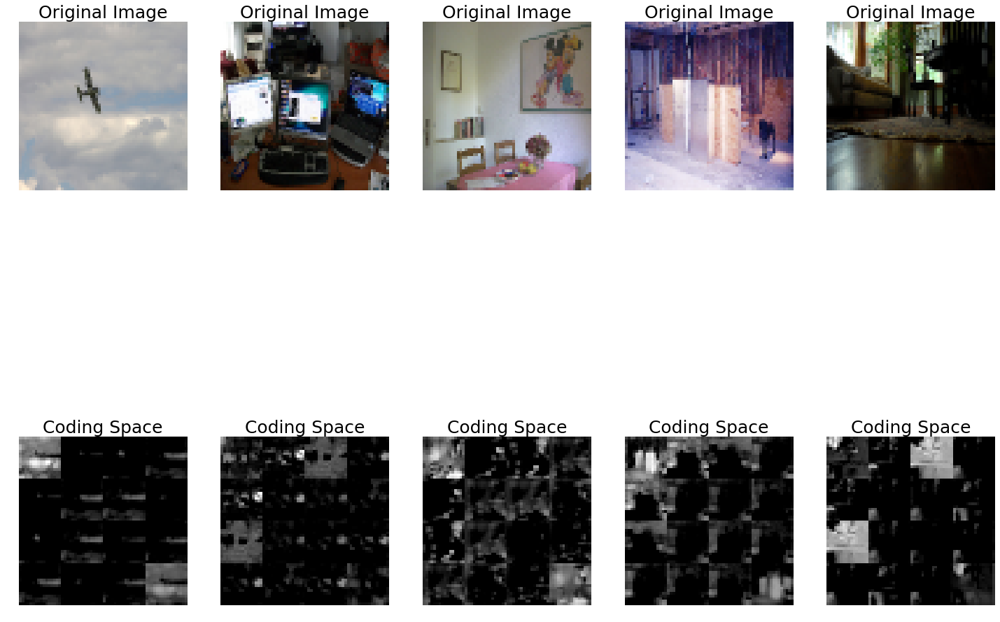

In [58]:
print(aeo_without_finetune_model.layers[12].name)
coding_model = Model(inputs=aeo_without_finetune_model.input, outputs=aeo_without_finetune_model.layers[12].output)
coding_predictions = coding_model.predict(x_test)
print(np.shape(coding_predictions))


codingStack = []
actImgStack = []
for idx in ran_idx:
    coding_space = get_coding_space(coding_predictions,idx)
    codingStack.append(coding_space)
    actImgStack.append(cv2.resize(x_test[idx], dsize=(64,64)))

fig = plt.figure(figsize=(25,20))
ax = fig.subplots(2, 5)
i=0
for index in range(5):
    ax[0,i].imshow(actImgStack[index])
    ax[0,i].axis('off')
    ax[0,i].set_title('Original Image', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    ax[1,i].imshow(codingStack[index],cmap='gray')
    ax[1,i].axis('off')
    ax[1,i].set_title('Coding Space', fontdict={'fontsize': 25, 'fontweight': 'medium'})
    i = i+1
plt.show()

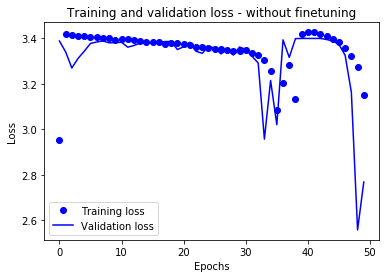

In [59]:
history = pd.read_pickle('aeo_without_finetune_model_history_dict')
loss = history['loss']
val_loss = history['val_loss']
epochs = range(n_epochs)
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss - without finetuning')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [60]:
#['aeroplane', 'car', 'chair', 'dog', 'bird']
y_predict_test = aeo_without_finetune_model.predict(x_test)

test_images_list = []
actual_y_test_list = []
predicted_probablities_y_test_list = []
predicted_y_test_list = []
count_unclassified = 0
for i in range(y_test.shape[0]):
    test_images_list.append(x_test[i])
    actual_y_test_list.append(y_test[i])
    predicted_probablities_y_test_list.append(y_predict_test[i])
    
    predicted = (y_predict_test[i]>0.5).astype(int)
    num_predicted_classes = predicted.sum()
    if(num_predicted_classes==0):
        arg_maxprob = np.argmax(y_predict_test[i])
        predicted[arg_maxprob] = 1
        count_unclassified = count_unclassified+1
    predicted_y_test_list.append(predicted)

df = pd.DataFrame()
df['Test_Images_Array'] = test_images_list
df['Actual'] = actual_y_test_list
df['Predict_Proba'] = predicted_probablities_y_test_list
df['Predicted'] = predicted_y_test_list
df['Confusion_Metrics'] = ''

for index,row in df.iterrows():
    a = row['Actual'] #Actual
    p = row['Predicted'] #Predicted
    TP, TN, FP, FN = 0, 0, 0, 0
    confu_metric_list = []
    for i in range(len(a)):
        if((a[i] == p[i]) & (a[i] == 1)):
            TP = TP + 1
            confu_metric_list.append('TP')
        if((a[i] == p[i]) & (a[i] == 0)):
            TN = TN + 1
            confu_metric_list.append('TN')
        if((a[i] != p[i]) & (a[i] == 1)):
            FN = FN + 1
            confu_metric_list.append('FN')
        if((a[i] != p[i]) & (a[i] == 0)):
            FP = FP + 1
            confu_metric_list.append('FP')
    df.at[index,'Confusion_Metrics'] = confu_metric_list
without_ft_df = df.copy()
print(df.shape)
print(count_unclassified)
df.head()

(735, 5)
370


,Test_Images_Array,Actual,Predict_Proba,Predicted,Confusion_Metrics
0,"[[[216, 220, 229], [216, 220, 229], [218, 222,...","[1, 0, 0, 0, 0]","[0.0, 0.0, 0.9999835, 0.0, 0.0]","[0, 0, 1, 0, 0]","[FN, TN, FP, TN, TN]"
1,"[[[9, 11, 8], [9, 11, 8], [7, 9, 7], [8, 10, 9...","[0, 0, 0, 1, 0]","[0.0, 0.0, 0.99999964, 0.0, 0.0]","[0, 0, 1, 0, 0]","[TN, TN, FP, FN, TN]"
2,"[[[59, 61, 47], [68, 71, 62], [73, 76, 68], [7...","[0, 1, 0, 0, 0]","[0.0, 0.0, 0.8884423, 0.0, 0.0]","[0, 0, 1, 0, 0]","[TN, FN, FP, TN, TN]"
3,"[[[33, 29, 18], [32, 28, 17], [33, 29, 17], [3...","[0, 0, 0, 0, 1]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, TN, TN, TN, FN]"
4,"[[[113, 148, 174], [78, 101, 127], [45, 36, 42...","[0, 1, 0, 0, 0]","[0.0, 0.0, 7.966161e-05, 0.0, 0.0]","[0, 0, 1, 0, 0]","[TN, FN, FP, TN, TN]"


In [61]:
all_class_metric_list_of_dicts = []
for i in range(n_classes):
    metrics_dict = {}
    count_TP, count_TN, count_FP, count_FN = 0, 0, 0, 0
    for index,row in df.iterrows():
        if row['Confusion_Metrics'][i] == 'TP':
            count_TP = count_TP + 1
        if row['Confusion_Metrics'][i] == 'TN':
            count_TN = count_TN + 1
        if row['Confusion_Metrics'][i] == 'FP':
            count_FP = count_FP + 1
        if row['Confusion_Metrics'][i] == 'FN':
            count_FN = count_FN + 1
    metrics_dict['TP'] = count_TP
    metrics_dict['TN'] = count_TN
    metrics_dict['FP'] = count_FP
    metrics_dict['FN'] = count_FN
    all_class_metric_list_of_dicts.append(metrics_dict)
  
class_names = ['aeroplane', 'car', 'chair', 'dog', 'bird']
for i in range(len(all_class_metric_list_of_dicts)):
    all_class_metric_list_of_dicts[i]['Class_Name'] = class_names[i]
    dict = all_class_metric_list_of_dicts[i]
    accuracy = np.round(((dict['TP'] + dict['TN'])/(dict['TP'] + dict['TN'] + dict['FP'] + dict['FN'])),4)
    all_class_metric_list_of_dicts[i]['Accuracy'] = accuracy
    if (dict['TP']==0):
        precision = ''
        recall = ''
        f1 = ''
        print('Warning, number of true positives is 0 for class: ' + class_names[i])
    else:
        precision = np.round(dict['TP']/(dict['TP']+dict['FP']),4)
        recall = np.round(dict['TP']/(dict['TP']+dict['FN']),4)
        f1 = np.round((2 * (precision*recall)/(precision+recall)),4)
    all_class_metric_list_of_dicts[i]['Precision'] = precision
    all_class_metric_list_of_dicts[i]['Recall'] = recall
    all_class_metric_list_of_dicts[i]['F1'] = f1
  
without_finetuned_metric_df = pd.DataFrame(all_class_metric_list_of_dicts)
without_finetuned_metric_df = without_finetuned_metric_df[['Class_Name','TP','TN','FP','FN','Accuracy','Precision','Recall','F1']]
without_finetuned_metric_df

Warning, number of true positives is 0 for class: car


,Class_Name,TP,TN,FP,FN,Accuracy,Precision,Recall,F1
0,aeroplane,26,554,62,93,0.7891,0.2955,0.2185,0.2512
1,car,0,515,0,220,0.7007,,,
2,chair,160,83,486,6,0.3306,0.2477,0.9639,0.3941
3,dog,14,541,14,166,0.7551,0.5,0.0778,0.1346
4,bird,11,549,72,103,0.7619,0.1325,0.0965,0.1117


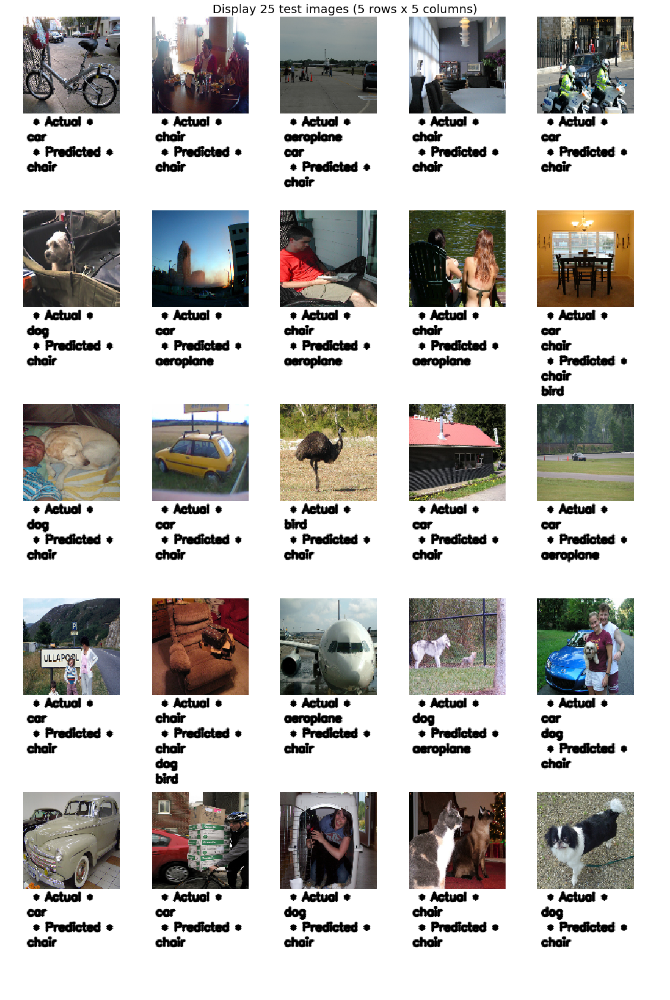

In [62]:
vStack = []
for j in range(5):
    h_list = []
    h_list_desc = []
    for i in range(5):
        img = df['Test_Images_Array'].iloc[random_indices[i+j*5]]
        act_y = df['Actual'].iloc[random_indices[i+j*5]]
        pred_y = df['Predicted'].iloc[random_indices[i+j*5]]
        h_list.append(img)
        h_list.append(hblank)  #Append blank images
        h_list_desc.append(write_on_blank(get_blank(),act_y,pred_y))
        h_list_desc.append(hblank)
    h_tuple = tuple(h_list)
    vStack.append(np.hstack((h_tuple)))
    h_desc_tuple = tuple(h_list_desc)
    vStack.append(np.hstack((h_desc_tuple)))

image_list = [tuple(vStack[j]) for j in range(len(vStack))]
image = np.vstack((tuple(image_list)))

plt.figure(figsize=(25,30))
plt.title('Display 25 test images (5 rows x 5 columns)', fontsize=20)
plt.axis('off')
plt.imsave('aeo_without_finetuned_predictions.png', image)
plt.imshow(image)

In [63]:
#finetuned model
#Row-wise precision & Recall calculation: Meaning metrics are calculated for each image (5 classes) & results are averaged
without_ft_df['Precision'] = ''
without_ft_df['Recall'] = ''
without_ft_df['F1'] = ''

for index,row in without_ft_df.iterrows():
    a = row['Actual'] #Actual
    p = row['Predicted'] #Predicted
    TP, TN, FP, FN = 0, 0, 0, 0
    for i in range(len(a)):
        if((a[i] == p[i]) & (a[i] == 1)):
            TP = TP + 1
        if((a[i] == p[i]) & (a[i] == 0)):
            TN = TN + 1
        if((a[i] != p[i]) & (a[i] == 1)):
            FN = FN + 1
        if((a[i] != p[i]) & (a[i] == 0)):
            FP = FP + 1
    precision = np.round(TP/(TP+FP),3)
    recall = np.round(TP/(TP+FN),3)
    f1 = np.round(2 * (precision*recall)/(precision+recall),3)
    without_ft_df.at[index,'Precision'] = precision
    without_ft_df.at[index,'Recall'] = recall
    without_ft_df.at[index,'F1'] = f1

print(without_ft_df.shape)
print(count_unclassified)
print('Mean of Precision: ' + str(np.round(without_ft_df['Precision'].mean(),4)))
print('Mean of Recall: ' + str(np.round(without_ft_df['Recall'].mean(),4)))
without_ft_df.head()

C:\Users\Triguna\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in double_scalars


(735, 8)
370
Mean of Precision: 0.2424
Mean of Recall: 0.2685


,Test_Images_Array,Actual,Predict_Proba,Predicted,Confusion_Metrics,Precision,Recall,F1
0,"[[[216, 220, 229], [216, 220, 229], [218, 222,...","[1, 0, 0, 0, 0]","[0.0, 0.0, 0.9999835, 0.0, 0.0]","[0, 0, 1, 0, 0]","[FN, TN, FP, TN, TN]",0,0,NaN
1,"[[[9, 11, 8], [9, 11, 8], [7, 9, 7], [8, 10, 9...","[0, 0, 0, 1, 0]","[0.0, 0.0, 0.99999964, 0.0, 0.0]","[0, 0, 1, 0, 0]","[TN, TN, FP, FN, TN]",0,0,NaN
2,"[[[59, 61, 47], [68, 71, 62], [73, 76, 68], [7...","[0, 1, 0, 0, 0]","[0.0, 0.0, 0.8884423, 0.0, 0.0]","[0, 0, 1, 0, 0]","[TN, FN, FP, TN, TN]",0,0,NaN
3,"[[[33, 29, 18], [32, 28, 17], [33, 29, 17], [3...","[0, 0, 0, 0, 1]","[0.0, 0.0, 0.0, 0.0, 0.0]","[1, 0, 0, 0, 0]","[FP, TN, TN, TN, FN]",0,0,NaN
4,"[[[113, 148, 174], [78, 101, 127], [45, 36, 42...","[0, 1, 0, 0, 0]","[0.0, 0.0, 7.966161e-05, 0.0, 0.0]","[0, 0, 1, 0, 0]","[TN, FN, FP, TN, TN]",0,0,NaN
